# import libraries and functions

In [4]:
import sys
import os

In [6]:
this_dir = os.getcwd()
project_root = os.path.abspath(os.path.join(this_dir, os.pardir))
if project_root not in sys.path:
    sys.path.insert(0, project_root)
os.chdir(project_root)

In [8]:
import kg_rag.util as funct
from kg_rag.util import * 

In [9]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

## functions

In [10]:
sentence_embedding_model='pritamdeka/S-PubMedBert-MS-MARCO'
embedding_function = load_sentence_transformer(sentence_embedding_model)

## Drug-entity-extraction

In [9]:
DRUG_ENTITY_EXTRACTION= """ You are an expert drug entity extractor from a sentence and report it as JSON in the following format:
  Drugs: <List of extracted entities>
  Please report only Drugs. Do not report any other entities like Diseases, Genes, Proteins, or Enzymes."""

In [10]:
def drug_entity_extractor_v2(text):
    chat_model_id, chat_deployment_id = get_gpt35()
    # prompt_updated = system_prompts["DRUG_ENTITY_EXTRACTION"] + "\n" + "Sentence : " + text
    prompt_updated = DRUG_ENTITY_EXTRACTION + "\n" + "Sentence : " + text
    # resp = get_GPT_response(prompt_updated, system_prompts["DRUG_ENTITY_EXTRACTION"], chat_model_id, chat_deployment_id, temperature=0)
    resp = get_GPT_response(prompt_updated, DRUG_ENTITY_EXTRACTION, chat_model_id, chat_deployment_id, temperature=0)
    try:
        entity_dict = json.loads(resp)
        return entity_dict["Drugs"]
    except:
        return None

## biobert

In [11]:
from sentence_transformers import SentenceTransformer, util
model = SentenceTransformer('pritamdeka/BioBERT-mnli-snli-scinli-scitail-mednli-stsb')

def safe_extract_text(cell):
    """Extract first string from a list or parse from a string-represented list."""
    if isinstance(cell, list):
        return cell[0] if cell else ''
    if isinstance(cell, str):
        try:
            parsed = ast.literal_eval(cell)
            if isinstance(parsed, list) and parsed:
                return parsed[0]
        except Exception:
            pass
        return cell
    return ''

def compute_biobert_cosine_similarity(df, list_col, str_col, output_col='cosine_similarity'):
    similarities = []

    for _, row in tqdm(df.iterrows(), total=len(df), desc="Calculating similarity"):
        text1 = safe_extract_text(row[list_col])
        text2 = str(row[str_col]) if pd.notna(row[str_col]) else ''
        
        if not text1.strip() or not text2.strip():
            similarities.append(None)
            continue
        
        try:
            emb1 = model.encode(text1, convert_to_tensor=True)
            emb2 = model.encode(text2, convert_to_tensor=True)
            score = util.pytorch_cos_sim(emb1, emb2).item()
            similarities.append(round(score,2))
        except Exception as e:
            print(f"Error at row: {text1}, {text2} -> {e}")
            similarities.append(None)

    df[output_col] = similarities
    return df

# BTE Query

In [11]:
DMDB_go_bp_df = pd.read_csv("DMDB_benchmark/Benchmarks/DMDB_go_bp_filtered.csv")
DMDB_go_bp_df.shape

(842, 16)

In [14]:
DMDB_bp_sampled_disease_go = DMDB_go_bp_df[["disease", "disease_name", "bp","bp_name"]]
DMDB_bp_sampled_disease_go.shape

(842, 4)

In [15]:
DMDB_bp_sampled_disease_go_pivot = pd.melt(DMDB_bp_sampled_disease_go, value_vars=["disease", "bp"], var_name="type", value_name="entity_id")
DMDB_bp_sampled_disease_go_pivot["name"] = pd.melt(DMDB_bp_sampled_disease_go, value_vars=["disease_name", "bp_name"], value_name="name")["name"]
DMDB_bp_sampled_disease_go_pivot["type"] = DMDB_bp_sampled_disease_go_pivot["type"].map({"disease": "disease", "bp": "go"})
DMDB_bp_sampled_disease_go_pivot.shape

(1684, 3)

In [16]:
DMDB_bp_sampled_disease_go_pivot = DMDB_bp_sampled_disease_go_pivot.drop_duplicates()
DMDB_bp_sampled_disease_go_pivot.shape

(605, 3)

In [17]:
DMDB_bp_sampled_disease_go_pivot[["entity_id", "name"]].nunique()

entity_id    605
name         602
dtype: int64

In [23]:
DMDB_bp_sampled_disease_go_pivot.tail(1)

,type,entity_id,name
1683,go,GO:0120178,steroid hormone biosynthetic process


In [18]:
DMDB_bp_sampled_disease_go_pivot["type"].value_counts()

type
disease    378
go         227
Name: count, dtype: int64

In [25]:
def get_node_context(entity_id, entity_type):
    try:
        # Determine category for n0 and n1 based on entity_type
        if entity_type.lower() == "disease":
            category_n0 = "biolink:Disease"
            category_n1 = ["biolink:ChemicalEntity"]
        else:  # biological process or activity
            category_n0 = "biolink:BiologicalProcessOrActivity"
            category_n1 = ["biolink:Gene"]

        base_uri = "https://bte.transltr.io/v1/query"
        query = {
            "message": {
                "query_graph": {
                    "nodes": {
                        "n0": {"categories": [category_n0], "ids": [entity_id]},
                        "n1": {"categories": category_n1}
                    },
                    "edges": {
                        "e01": {"subject": "n0", "object": "n1"}
                    }
                }
            }
        }

        print("Sending query:", query)
        result = get_bte_api_resp(base_uri, query)

        if result.get('status') == 500:
            print(f"Error from BTE API for {entity_id}: {result.get('description', 'No description provided')}")
            return None

        return result

    except Exception as e:
        print(f"Exception for {entity_id}: {e}")
        return None

In [26]:
def serialize_result(result):
    """Compress and serialize a JSON-compatible object."""
    return zlib.compress(json.dumps(result).encode())

def deserialize_result(serialized_result):
    """Decompress and deserialize the stored context."""
    return json.loads(zlib.decompress(serialized_result).decode())

# def process_entities(df, results_filepath="data/analysis_results/DMDB_go_bp_sampled.parquet"):  #first run, category_n0 = "biolink:Disease", category_n1 = ["biolink:ChemicalEntity", "biolink:BiologicalProcessOrActivity"]
# def process_entities(df, results_filepath="data/analysis_results/DMDB_go_bp_sampled_separately.parquet"): #second run; category_n0 = "biolink:Disease", category_n1 = ["biolink:ChemicalEntity"] and separately ,category_n0 = "biolink:Disease", category_n1 ="biolink:BiologicalProcessOrActivity"]
def process_entities(df, results_filepath="data/analysis_results/DMDB_go_bp_sampled_separately_V2.parquet"): #third run; category_n0 = "biolink:BiologicalProcessOrActivity", category_n1 = ["biolink:Gene"] and separately ,category_n0 = "biolink:Disease", category_n1 ="ChemicalEntity"
    """
    Process entities from the input DataFrame to retrieve their BTE context.
    
    Parameters:
      - df: A DataFrame with at least the columns 'type' and 'entity_id'.
      - results_filepath: Path to the file where results are stored.
      
    Returns:
      - A DataFrame with the retrieved context for each entity.
    """
    try:
        results_df = pd.read_parquet(results_filepath)
    except FileNotFoundError:
        results_df = pd.DataFrame(columns=["entity_id", "name", "type", "context"])

    # Keep track of already processed entity IDs to avoid duplicates
    processed_entity_ids = set(results_df["entity_id"])

    for _, row in df.iterrows():
        entity_id = row["entity_id"]
        entity_type = row["type"]
        name = row["name"]

        if entity_id is None or entity_id in processed_entity_ids:
            continue

        context = get_node_context(entity_id, entity_type)
        if context is None:
            serialized_context = None  # You might log or handle errors here as needed
        else:
            serialized_context = serialize_result(context)

        new_row = pd.DataFrame({
            "entity_id": [entity_id],
            "name": [name],
            "type": [entity_type],
            "context": [serialized_context]
        })
        results_df = pd.concat([results_df, new_row], ignore_index=True)
        processed_entity_ids.add(entity_id)

        # Save after each new entry (adjust frequency as desired)
        results_df.to_parquet(results_filepath, compression="snappy")
    
    # return results_df

In [52]:
process_entities(DMDB_bp_sampled_disease_go_pivot)

Sending query: {'message': {'query_graph': {'nodes': {'n0': {'categories': ['biolink:Disease'], 'ids': ['MESH:D007251']}, 'n1': {'categories': ['biolink:ChemicalEntity']}}, 'edges': {'e01': {'subject': 'n0', 'object': 'n1'}}}}}


In [9]:
DMDB_go_bp_sep_bte_parquet = pd.read_parquet("data/analysis_results/DMDB_go_bp_sampled_separately_V2.parquet")
DMDB_go_bp_sep_bte_parquet.shape

(605, 5)

In [10]:
DMDB_go_bp_sep_bte_parquet.columns

Index(['entity_id', 'name', 'type', 'context', 'results'], dtype='object')

In [142]:
DMDB_go_bp_sep_bte_parquet[["entity_id", "name", "type"]].head(5)

,entity_id,name,type
0,MESH:D004927,Escherichia coli Infections,disease
1,MESH:D011618,Psychotic Disorders,disease
2,GO:0034699,Response to luteinizing hormone,go
3,GO:0090592,DNA synthesis involved in DNA replication,go
4,MESH:D010032,Otitis externa,disease


In [ ]:
# remove last 4 rows from DMDB_go_bp_sep_bte_parquet
# DMDB_go_bp_sep_bte_parquet = DMDB_go_bp_sep_bte_parquet[:-4]
# DMDB_go_bp_sep_bte_parquet[["entity_id", "name", "type"]].tail(5)
# # save the updated DataFrame
# DMDB_go_bp_sep_bte_parquet.to_parquet("data/analysis_results/DMDB_go_bp_sampled_separately_V2.parquet", compression="snappy")

In [21]:
DMDB_go_bp_sep_bte_parquet = pd.read_parquet("data/analysis_results/DMDB_go_bp_sampled_separately_V2.parquet")
DMDB_go_bp_sep_bte_parquet.shape

(605, 5)

In [20]:
DMDB_bp_sampled_disease_go_pivot["type"].value_counts()

type
disease    378
go         227
Name: count, dtype: int64

In [11]:
# context = deserialize_result(DMDB_go_bp_sep_bte_parquet.loc[1, "context"])
# context

{'description': 'Query processed successfully, retrieved 925 results.',
 'schema_version': '1.5.0',
 'biolink_version': '4.2.2',
 'workflow': [{'id': 'lookup_and_score'}],
 'message': {'query_graph': {'nodes': {'n0': {'categories': ['biolink:Disease'],
     'ids': ['MESH:D011618']},
    'n1': {'categories': ['biolink:ChemicalEntity']}},
   'edges': {'e01': {'subject': 'n0', 'object': 'n1'}}},
  'knowledge_graph': {'nodes': {'MONDO:0005485': {'categories': ['biolink:Disease'],
     'name': 'psychosis',
     'attributes': [{'attribute_type_id': 'biolink:xref',
       'value': ['MONDO:0005485',
        'DOID:2468',
        'EFO:0005407',
        'UMLS:C0029516',
        'UMLS:C0033975',
        'MESH:D011618',
        'MEDDRA:10037234',
        'MEDDRA:10037241',
        'MEDDRA:10037248',
        'MEDDRA:10037253',
        'MEDDRA:10046122',
        'MEDDRA:10059419',
        'MEDDRA:10061920',
        'NCIT:C78576',
        'SNOMEDCT:69322001',
        'medgen:19568',
        'ICD9:298.

In [145]:
def extract_results_count_with_deserialization(context_str):
    try:
        context_dict = deserialize_result(context_str)
        description = context_dict.get("description", "")
        match = re.search(r"retrieved (\d+) results", description)
        return int(match.group(1)) if match else None
    except Exception:
        return None

# Apply to all rows
DMDB_go_bp_sep_bte_parquet["results"] = DMDB_go_bp_sep_bte_parquet["context"].apply(extract_results_count_with_deserialization)

In [146]:
DMDB_go_bp_sep_bte_parquet[["entity_id", "name","type","results"]].head(2)

,entity_id,name,type,results
0,MESH:D004927,Escherichia coli Infections,disease,170
1,MESH:D011618,Psychotic Disorders,disease,925


In [147]:
# find all rows that results = 0
DMDB_go_bp_sep_bte_parquet[DMDB_go_bp_sep_bte_parquet["results"]==0][["entity_id", "name","type","results"]].shape

(33, 4)

In [22]:
# DMDB_go_bp_sep_bte_parquet[DMDB_go_bp_sep_bte_parquet["results"]==0][["entity_id", "name","type","results"]]

In [23]:
none_count = 0
error_count = 0
valid_count = 0

for index, row in DMDB_go_bp_sep_bte_parquet.iterrows():
    context = row["context"]
    if context is None:
        none_count += 1
    elif isinstance(context, str) and context.startswith("error:"):
        error_count += 1
    else:
        valid_count += 1

print("Rows with context = None:", none_count)
print("Rows with error context:", error_count)
print("Rows with valid context:", valid_count)

Rows with context = None: 0
Rows with error context: 0
Rows with valid context: 605


In [56]:
# find rows with context = None
DMDB_go_bp_sep_bte_parquet[DMDB_go_bp_sep_bte_parquet["context"].isna()][["entity_id", "name","type","results"]]

,entity_id,name,type,results


In [24]:
#remove these rows from the DataFrame
DMDB_go_bp_sep_bte_parquet = DMDB_go_bp_sep_bte_parquet[DMDB_go_bp_sep_bte_parquet["context"].notna()]
DMDB_go_bp_sep_bte_parquet.shape

(605, 5)

In [ ]:
#save the updated DataFrame
# DMDB_go_bp_sep_bte_parquet.to_parquet("data/analysis_results/DMDB_go_bp_sampled_separately_V2.parquet", compression="snappy")

# Biological Process

In [25]:
DMDB_go_bp_df = pd.read_csv("DMDB_benchmark/Benchmarks/DMDB_go_bp_filtered.csv")
DMDB_go_bp_df.shape

(842, 16)

In [26]:
DMDB_go_bp_df.head(1)

,idx,id,drug,Drug_MeshID,disease,bp,drug_name,disease_name,bp_name,nodes,n_nodes,n_edges,n_paths,metapath,metapath_with_edges,question
0,1,DB00619_MESH_D034721_1,DRUGBANK:DB00619,MESH:D000068877,MESH:D034721,GO:0008283,imatinib,Systemic mast cell disease,cell population proliferation,"['MESH:D000068877', 'UniProt:P10721', 'UniProt:P16234', 'GO:0008283', 'MESH:D034721']",5,5,1,['Drug - Protein - BiologicalProcess - Disease'],['Drug - decreases activity of - Protein - positively regulates - BiologicalProcess - causes - Disease'],Which Drug can be used in the treatment of Systemic mast cell disease by targeting biological process: cell population proliferation?


In [27]:
DMDB_go_bp_df["count"] = DMDB_go_bp_df["bp"].apply(lambda x: len(x.split(",")))

In [28]:
DMDB_go_bp_df["count"].value_counts()

count
1    842
Name: count, dtype: int64

In [29]:
DMDB_go_bp_df.head(1)

,idx,id,drug,Drug_MeshID,disease,bp,drug_name,disease_name,bp_name,nodes,n_nodes,n_edges,n_paths,metapath,metapath_with_edges,question,count
0,1,DB00619_MESH_D034721_1,DRUGBANK:DB00619,MESH:D000068877,MESH:D034721,GO:0008283,imatinib,Systemic mast cell disease,cell population proliferation,"['MESH:D000068877', 'UniProt:P10721', 'UniProt:P16234', 'GO:0008283', 'MESH:D034721']",5,5,1,['Drug - Protein - BiologicalProcess - Disease'],['Drug - decreases activity of - Protein - positively regulates - BiologicalProcess - causes - Disease'],Which Drug can be used in the treatment of Systemic mast cell disease by targeting biological process: cell population proliferation?,1


## LLM-only

In [278]:
DMDB_go_bp_df.shape

(842, 16)

#### gpt-4o-mini

In [37]:
config_data["SAVE_RESULTS_PATH"]

'data/analysis_results'

In [38]:
CHAT_MODEL_ID = "gpt-4o-mini"
CHAT_DEPLOYMENT_ID = "gpt-4o-mini"
SAVE_PATH = 'data/analysis_results/bp_results'
TEMPERATURE = config_data["LLM_TEMPERATURE"]
print("TEMPERATURE:", TEMPERATURE)
print("SAVE_PATH:", SAVE_PATH)

TEMPERATURE: 0
SAVE_PATH: data/analysis_results/bp_results


In [39]:
SYSTEM_PROMPT = """ 'You are an expert biomedical researcher. Please provide your answer (only Drug names) in the following JSON format for the Question asked:
{{
  "answer": <correct answer>
}}'
"""

In [40]:
print("SYSTEM_PROMPT:", SYSTEM_PROMPT)

SYSTEM_PROMPT:  'You are an expert biomedical researcher. Please provide your answer (only Drug names) in the following JSON format for the Question asked:
{{
  "answer": <correct answer>
}}'



In [41]:
save_name = "_".join(CHAT_MODEL_ID.split("-"))+"_prompt-testing"+"_DMDB_go_bp_842qa.csv"
print("save_name:",save_name)

save_name: gpt_4o_mini_prompt-testing_DMDB_go_bp_842qa.csv


In [42]:
DMDB_go_bp_df.head(1)

,idx,id,drug,Drug_MeshID,disease,bp,drug_name,disease_name,bp_name,nodes,n_nodes,n_edges,n_paths,metapath,metapath_with_edges,question,count
0,1,DB00619_MESH_D034721_1,DRUGBANK:DB00619,MESH:D000068877,MESH:D034721,GO:0008283,imatinib,Systemic mast cell disease,cell population proliferation,"['MESH:D000068877', 'UniProt:P10721', 'UniProt:P16234', 'GO:0008283', 'MESH:D034721']",5,5,1,['Drug - Protein - BiologicalProcess - Disease'],['Drug - decreases activity of - Protein - positively regulates - BiologicalProcess - causes - Disease'],Which Drug can be used in the treatment of Systemic mast cell disease by targeting biological process: cell population proliferation?,1


In [50]:
start_time = time.time()
answer_list = []
for index, row in DMDB_go_bp_df.iterrows():
    question = "Question: "+ row["question"]
    print(f"Processing question {index + 1}/{len(DMDB_go_bp_df)}: {question}")
    try:
        output = get_GPT_response(question, SYSTEM_PROMPT, CHAT_MODEL_ID, CHAT_DEPLOYMENT_ID, temperature=TEMPERATURE)
        answer_list.append((row["id"],row["count"],row["question"], row["drug_name"], row["disease_name"], row['Drug_MeshID'], row['disease'],row["bp"], row["bp_name"], output))
        print(f"Success: Processed question {index + 1}")
    except Exception as e:
        print(f"Error processing question {index + 1}: {e}")
        answer_list.append((row["id"],row["count"],row["question"], row["drug_name"], row["disease_name"], row['Drug_MeshID'], row['disease'],row["bp"], row["bp_name"], "Error"))
        continue                  
answer_df = pd.DataFrame(answer_list, columns=["id","count","question", "drug_name", "disease_name",'Drug_MeshID','disease',"bp", "bp_name", "llm_answer_prompt_test"])
answer_df.to_csv(os.path.join(SAVE_PATH, save_name), index=False, header=True)
print("Completed in {} min".format((time.time()-start_time)/60))

Processing question 1/842: Question: Which Drug can be used in the treatment of Systemic mast cell disease by targeting biological process: cell population proliferation?
Success: Processed question 1
Processing question 2/842: Question: Which Drug can be used in the treatment of Fever by targeting biological process: temperature homeostasis?
Success: Processed question 2
Processing question 3/842: Question: Which Drug can be used in the treatment of Pain by targeting biological process: inflammatory response?
Success: Processed question 3
Processing question 4/842: Question: Which Drug can be used in the treatment of CMV infection by targeting biological process: viral DNA genome replication?
Success: Processed question 4
Processing question 5/842: Question: Which Drug can be used in the treatment of Bacterial septicemia by targeting biological process: bacterial Nucleic Acid synthesis?
Success: Processed question 5
Processing question 6/842: Question: Which Drug can be used in the tr

In [31]:
go_bp_sampled_questions_4omini = pd.read_csv("data/analysis_results/bp_results/gpt_4o_mini_prompt-testing_DMDB_go_bp_842qa.csv")
go_bp_sampled_questions_4omini.shape

(842, 10)

In [34]:
go_bp_sampled_questions_4omini["llm_answer_prompt_test_answer"] = go_bp_sampled_questions_4omini["llm_answer_prompt_test"].apply(extract_answer)
go_bp_sampled_questions_4omini = compute_biobert_cosine_similarity(
    go_bp_sampled_questions_4omini,
    list_col='drug_name',
    str_col='llm_answer_prompt_test_answer',
    output_col='cosine_similarity'
)


Calculating similarity: 100%|████████████████████████| 842/842 [00:16<00:00, 49.94it/s]


In [42]:
# go_bp_sampled_questions_4omini.to_csv("data/analysis_results/bp_results/gpt4omini_prompt_analysed.csv", index=False)


In [27]:
go_bp_sampled_questions_4omini = pd.read_csv("data/analysis_results/bp_results/gpt4omini_prompt_analysed.csv")
go_bp_sampled_questions_4omini.columns 

Index(['id', 'count', 'question', 'drug_name', 'disease_name', 'Drug_MeshID',
       'disease', 'bp', 'bp_name', 'llm_answer_prompt_test',
       'llm_answer_prompt_test_answer', 'cosine_similarity'],
      dtype='object')

#### gpt-4o

In [35]:
CHAT_MODEL_ID = "gpt-4o"
CHAT_DEPLOYMENT_ID = "gpt-4o"
SAVE_PATH = 'data/analysis_results/bp_results'
TEMPERATURE = config_data["LLM_TEMPERATURE"]
print("TEMPERATURE:", TEMPERATURE)
print("SAVE_PATH:", SAVE_PATH)

TEMPERATURE: 0
SAVE_PATH: data/analysis_results/bp_results


In [36]:
SYSTEM_PROMPT = """ 'You are an expert biomedical researcher. Please provide your answer (only Drug names) in the following JSON format for the Question asked:
{{
  "answer": <correct answer>
}}'
"""

In [37]:
print("SYSTEM_PROMPT:", SYSTEM_PROMPT)

SYSTEM_PROMPT:  'You are an expert biomedical researcher. Please provide your answer (only Drug names) in the following JSON format for the Question asked:
{{
  "answer": <correct answer>
}}'



In [56]:
save_name = "_".join(CHAT_MODEL_ID.split("-"))+"_prompt-testing"+"_DMDB_go_bp_842qa.csv"
print("save_name:",save_name)

save_name: gpt_4o_prompt-testing_DMDB_go_bp_842qa.csv


In [59]:
DMDB_go_bp_df.shape

(842, 17)

In [61]:
start_time = time.time()
answer_list = []
for index, row in DMDB_go_bp_df.iterrows():
    question = "Question: "+ row["question"]
    print(f"Processing question {index + 1}/{len(DMDB_go_bp_df)}: {question}")
    try:
        output = get_GPT_response(question, SYSTEM_PROMPT, CHAT_MODEL_ID, CHAT_DEPLOYMENT_ID, temperature=TEMPERATURE)
        answer_list.append((row["id"],row["count"],row["question"], row["drug_name"], row["disease_name"], row['Drug_MeshID'], row['disease'],row["bp"], row["bp_name"], output))
        print(f"Success: Processed question {index + 1}")
    except Exception as e:
        print(f"Error processing question {index + 1}: {e}")
        answer_list.append((row["id"],row["count"],row["question"], row["drug_name"], row["disease_name"], row['Drug_MeshID'], row['disease'],row["bp"], row["bp_name"], "Error"))
        continue                  
answer_df = pd.DataFrame(answer_list, columns=["id","count","question", "drug_name", "disease_name",'Drug_MeshID','disease',"bp", "bp_name", "llm_answer_prompt_test"])
answer_df.to_csv(os.path.join(SAVE_PATH, save_name), index=False, header=True)
print("Completed in {} min".format((time.time()-start_time)/60))

Processing question 1/842: Question: Which Drug can be used in the treatment of Systemic mast cell disease by targeting biological process: cell population proliferation?
Success: Processed question 1
Processing question 2/842: Question: Which Drug can be used in the treatment of Fever by targeting biological process: temperature homeostasis?
Success: Processed question 2
Processing question 3/842: Question: Which Drug can be used in the treatment of Pain by targeting biological process: inflammatory response?
Success: Processed question 3
Processing question 4/842: Question: Which Drug can be used in the treatment of CMV infection by targeting biological process: viral DNA genome replication?
Success: Processed question 4
Processing question 5/842: Question: Which Drug can be used in the treatment of Bacterial septicemia by targeting biological process: bacterial Nucleic Acid synthesis?
Success: Processed question 5
Processing question 6/842: Question: Which Drug can be used in the tr

In [38]:
go_bp_sampled_questions_4o = pd.read_csv("data/analysis_results/bp_results/gpt_4o_prompt-testing_DMDB_go_bp_842qa.csv")
go_bp_sampled_questions_4o.shape

(842, 10)

In [39]:
go_bp_sampled_questions_4o["llm_answer_prompt_test_answer"] = go_bp_sampled_questions_4o["llm_answer_prompt_test"].apply(extract_answer)
go_bp_sampled_questions_4o = compute_biobert_cosine_similarity(
    go_bp_sampled_questions_4o,
    list_col='drug_name',
    str_col='llm_answer_prompt_test_answer',
    output_col='cosine_similarity'
)


Calculating similarity: 100%|████████████████████████| 842/842 [00:15<00:00, 54.08it/s]


In [40]:
# go_bp_sampled_questions_4o.to_csv("data/analysis_results/bp_results/gpt4o_prompt_analysed.csv", index=False)

In [28]:
go_bp_sampled_questions_4o = pd.read_csv("data/analysis_results/bp_results/gpt4o_prompt_analysed.csv")
go_bp_sampled_questions_4o.columns 

Index(['id', 'count', 'question', 'drug_name', 'disease_name', 'Drug_MeshID',
       'disease', 'bp', 'bp_name', 'llm_answer_prompt_test',
       'llm_answer_prompt_test_answer', 'cosine_similarity'],
      dtype='object')

## BTE-RAG

### get context for id

In [44]:
DMDB_go_bp_sep_bte_parquet = pd.read_parquet("data/analysis_results/DMDB_go_bp_sampled_separately_V2.parquet")
DMDB_go_bp_sep_bte_parquet.shape

(605, 5)

In [103]:
def get_context_for_id(doid):

    # Read the parquet file
    DMDB_go_bp_sep_bte_parquet = pd.read_parquet("data/analysis_results/DMDB_go_bp_sampled_separately_V2.parquet")
    
    # Check if the DOID exists; if not, return empty lists.
    if doid not in DMDB_go_bp_sep_bte_parquet["entity_id"].values:
        print(f"ID {doid} not found in the DataFrame.")
        return [], []
    
    try:
        context_serialized = DMDB_go_bp_sep_bte_parquet.loc[DMDB_go_bp_sep_bte_parquet["entity_id"] == doid, "context"].iloc[0]
        node_context = deserialize_result(context_serialized)
    except Exception as e:
        print(f"Exception for DOID {doid}: {str(e)}")
        return None

    # -------------------------------
    # Process the knowledge graph data
    # -------------------------------
    nbr_nodes = []
    nbr_edges = []

    # Use .get() with defaults to avoid key errors if keys are missing.
    nodes = node_context.get("message", {}).get("knowledge_graph", {}).get("nodes", {})
    edges = node_context.get("message", {}).get("knowledge_graph", {}).get("edges", {})

    # Processing node information
    for node_id, node_info in nodes.items():
        categories = ", ".join(node_info.get("categories", []))
        node_name = node_info.get("name", "")
        nbr_nodes.append((node_id, categories, node_name))

    # Processing edge information
    for edge_id, edge_info in edges.items():
        predicate = edge_info.get("predicate", "")
        subject = edge_info.get("subject", "")
        object_ = edge_info.get("object", "")
        primary_source = next(
            (source.get("resource_id") for source in edge_info.get("sources", [])
             if source.get("resource_role") == "primary_knowledge_source"),
            None
        )
        if primary_source:
            sources = primary_source
        else:
            sources = ", ".join(source.get("resource_id", "") for source in edge_info.get("sources", []))
        nbr_edges.append((subject, predicate, object_, sources))    

    # Create DataFrames for nodes and edges
    nbr_nodes_df = pd.DataFrame(nbr_nodes, columns=["node_id", "categories", "node_name"])
    nbr_edges_df = pd.DataFrame(nbr_edges, columns=["subject", "predicate", "object", "sources"])
    if not nbr_edges_df.empty:
        nbr_edges_df['sources'] = nbr_edges_df['sources'].str.upper()

    # Merge nodes and edges to create context strings.
    merge_1 = pd.merge(nbr_edges_df, nbr_nodes_df, left_on="subject", right_on="node_id",
                       suffixes=('', '_node')).drop("node_id", axis=1)
    merge_1["subject_description"] = merge_1["categories"] + " " + merge_1["node_name"]
    merge_1.drop(["categories", "node_name"], axis=1, inplace=True)

    merge_2 = pd.merge(merge_1, nbr_nodes_df, left_on="object", right_on="node_id", how="left",
                       suffixes=('', '_node')).drop("node_id", axis=1)
    merge_2["object_description"] = merge_2["categories"] + " " + merge_2["node_name"]
    merge_2.drop(["categories", "node_name"], axis=1, inplace=True)
    merge_2 = merge_2[merge_2["object_description"] != ""]

    merge_2 = merge_2.map(make_readable)  

    if doid.startswith("MESH:"):
        merge_2_filtered = merge_2[merge_2["predicate"] == "subject of treatment application or study for treatment by"].copy()  # disease
    elif doid.startswith("GO:"):
        merge_2_filtered = merge_2.copy()  # go
    else:
        merge_2_filtered = merge_2.copy() 
    # Create a context string for each edge.
    
    merge_2_filtered['context'] = merge_2_filtered.apply(
        lambda row: (
            f"{row['subject_description']} is {row['predicate']} "
            f"{row['object_description']}."
        ),
        axis=1
    )
    merge_2_filtered["subject_clean"] = merge_2_filtered["subject_description"].apply(clean_description)
    merge_2_filtered["object_clean"] = merge_2_filtered["object_description"].apply(clean_description)

    merge_2_filtered["context"] = merge_2_filtered.apply(
        lambda row: f"{row['subject_clean']} is {row['predicate']} {row['object_clean']}.",
        axis=1
    )

    grouped = (
    merge_2_filtered
    .groupby(["subject_clean", "predicate"])["object_clean"]
    .apply(list)
    .reset_index()
    )

    grouped["object_list_str"] = grouped["object_clean"].apply(objects_to_text)

    grouped["context_grouped"] = grouped.apply(
        lambda row: (
            f"{row['subject_clean']} is {row['predicate']} {row['object_list_str']}."
        ),
        axis=1
    )

    final_df = grouped[["context_grouped"]].drop_duplicates()
    node_context_final = final_df['context_grouped'].tolist()

    return node_context_final



### retriev_context for ID

In [104]:
#V7
def retrieve_context_v17(question, bp, bp_name, disease_id, disease_name, embedding_function, context_sim_threshold, context_sim_min_threshold, context_volume):
    print(question)
    
    question_embedding = embedding_function.embed_query(question)

    # Retrieve and process context for bp
    print("Processing GO ID:", bp)
    bp_context = get_context_for_id(bp)

    if bp_context:
        # Calculate similarity for the bp branch.
        bp_embeddings = embedding_function.embed_documents(bp_context)
        bp_similarities = [
            cosine_similarity(
                np.array(question_embedding).reshape(1, -1), 
                np.array(context_embedding).reshape(1, -1)
            )[0][0] for context_embedding in bp_embeddings
        ]
        bp_similarity_indices = sorted(
            [(sim, idx) for idx, sim in enumerate(bp_similarities)], 
            key=lambda x: x[0], 
            reverse=True
        )
        bp_percentile_threshold = np.percentile([s[0] for s in bp_similarity_indices], context_sim_threshold)
        high_similarity_bp_indices = [
            idx for sim, idx in bp_similarity_indices 
            if sim > bp_percentile_threshold and sim > context_sim_min_threshold
        ]
        high_similarity_bp_context = [bp_context[idx] for idx in high_similarity_bp_indices]
    else:
        print("bp context or data frame is empty; skipping similarity computations for bp.")
        high_similarity_bp_context = []

    # Retrieve and process context for disease_id
    print("Processing Disease ID:", disease_id)
    disease_context = get_context_for_id(disease_id)
    if disease_context:
        # Calculate similarity for the disease branch.
        disease_embeddings = embedding_function.embed_documents(disease_context)
        disease_similarities = [
            cosine_similarity(
                np.array(question_embedding).reshape(1, -1), 
                np.array(context_embedding).reshape(1, -1)
            )[0][0] for context_embedding in disease_embeddings
        ]
        disease_similarity_indices = sorted(
            [(sim, idx) for idx, sim in enumerate(disease_similarities)], 
            key=lambda x: x[0], 
            reverse=True
        )
        disease_percentile_threshold = np.percentile([s[0] for s in disease_similarity_indices], context_sim_threshold)
        high_similarity_disease_indices = [
            idx for sim, idx in disease_similarity_indices 
            if sim > disease_percentile_threshold and sim > context_sim_min_threshold
        ]
        high_similarity_disease_context = [disease_context[idx] for idx in high_similarity_disease_indices]
    else:
        print("Disease context or data frame is empty; skipping similarity computations for disease.")
        high_similarity_disease_context = []

    # Combine high-similarity contexts into output strings.
    combined_context = (
        f"Context for Disease {disease_name}:\n\n" +
        "\n".join(high_similarity_disease_context)+
        f"\n\nContext for bp {bp_name}:\n\n" +
        "\n".join(high_similarity_bp_context) 
    )
    node_context_extracted = combined_context + "\n"


    combined_context_str = ( 
    f"Context for Disease {disease_name}:\n\n" +
    "\n".join(disease_context if disease_context else []) + # Ensure it's an iterable
    f"\n\nContext for bp {bp_name}:\n\n" +
    "\n".join(bp_context if bp_context else [])
)
    print("few lines of combined_context_str", combined_context_str[:10])

    return node_context_extracted, combined_context_str


### retrieve_output_from_llm_v17

In [105]:
#V2
@retry(wait=wait_random_exponential(min=10, max=30), stop=stop_after_attempt(5))
def retrieve_output_from_llm_v17(
    question, node_context_extracted, combined_context_str, llm_type, system_prompt
):
    # Token limit
    # model = "cl100k_base"
    TOKEN_LIMIT = 128000
    TRUNCATED_TOKEN_COUNT = 127000

    

    # Truncate contexts if needed
    node_context_extracted_trunc, node_context_tokens_trunc = truncate_context(node_context_extracted, TRUNCATED_TOKEN_COUNT, "o200k_base")
    print("V672")
    
    combined_context_str_trunc, combined_context_tokens_trunc = truncate_context(combined_context_str, TRUNCATED_TOKEN_COUNT, "o200k_base")
    # print("2")

    # Generate outputs based on LLM type
    if llm_type == "llama":
        from langchain import PromptTemplate, LLMChain
        template = get_prompt("Context:\n\n{context} \n\nQuestion: {question}", system_prompt)
        prompt = PromptTemplate(template=template, input_variables=["context", "question"])
        llm = llama_model(
            config_data["LLAMA_MODEL_NAME"],
            config_data["LLAMA_MODEL_BRANCH"],
            config_data["LLM_CACHE_DIR"],
            stream=True,
            method=llama_method,
        )
        llm_chain = LLMChain(prompt=prompt, llm=llm)
        output = llm_chain.run(context=node_context_extracted, question=question)
    elif "gpt" in llm_type:
        # enriched_prompt_1 = "Context: " + node_context_extracted_trunc + "\n" + "Question: " + question
        enriched_prompt_1 = f"""
        Question: {question} 

        CONTEXT:
        {node_context_extracted_trunc}
        """
        output_1 = get_GPT_response(
            enriched_prompt_1, system_prompt, llm_type, llm_type, temperature=config_data["LLM_TEMPERATURE"]
        )
        print("done 1",output_1)

        # enriched_prompt_NC_final = "Context: " + combined_context_str_trunc + "\n" + "Question: " + question
        enriched_prompt_NC_final = f"""
        Question: {question}
        CONTEXT:
        {combined_context_str_trunc}
        """

        output_NC_final = get_GPT_response(
            enriched_prompt_NC_final, system_prompt, llm_type, llm_type, temperature=config_data["LLM_TEMPERATURE"]
        )
        print("done 2", output_NC_final)


    return (
        output_1,
        output_NC_final,
        node_context_extracted_trunc,
        combined_context_str_trunc,
        node_context_extracted,combined_context_str
    )

In [106]:
funct.get_context_for_id = get_context_for_id
funct.retrieve_context_v17 = retrieve_context_v17
funct.retrieve_output_from_llm_v17 =retrieve_output_from_llm_v17

### BTE-thresholded contexts 

In [107]:
def build_thresholded_context_df(
    questions_df,
    embedding_function,
    thresholds,
    min_threshold,
    context_volume,
    save_path
):
    # 1) load or initialize
    if os.path.exists(save_path):
        out_df = pd.read_csv(save_path)
    else:
        base_cols = [
            "id", "count", "question", "drug_name", "disease_name",
            "Drug_MeshID", "disease", "bp", "bp_name"
        ]
        thr_cols = []
        for thr in thresholds:
            thr_cols += [
                f"node_context_extracted_{thr}_compressed",
                f"combined_context_str_{thr}_compressed"
            ]
        out_df = pd.DataFrame(columns=base_cols + thr_cols)

    processed = set(out_df["question"])

    # 2) iterate questions
    for _, row in questions_df.iterrows():
        qid   = row["id"]
        question      = row["question"]
        drug_id       = row["Drug_MeshID"]
        drug_name     = row["drug_name"]
        disease_id    = row["disease"]
        disease_name  = row["disease_name"]
        count         = row["count"]
        bp  = row["bp"]
        bp_name = row["bp_name"]

        if question in processed:
            continue

        # prepare row
        row_dict = {
            "id": qid,
            "count": count,
            "question": question,
            "drug_name": drug_name,
            "disease_name": disease_name,
            "Drug_MeshID": drug_id,
            "disease": disease_id,
            "bp": bp,
            "bp_name": bp_name,
        }


        # 3) loop thresholds
        for thr in thresholds:
            try:
                node_ctx, combined_ctx = retrieve_context_v17(
                    question, bp, bp_name,
                    disease_id, disease_name,
                    embedding_function,
                    thr,
                    min_threshold,
                    context_volume
                )
                # compress JSON strings
                nc_json = json.dumps(node_ctx)
                cc_json = json.dumps(combined_ctx)
                row_dict[f"node_context_extracted_{thr}_compressed"]   = zlib.compress(nc_json.encode("utf-8"))
                row_dict[f"combined_context_str_{thr}_compressed"]    = zlib.compress(cc_json.encode("utf-8"))

            except Exception as e:
                # on error, store None
                row_dict[f"node_context_extracted_{thr}_compressed"]   = None
                row_dict[f"combined_context_str_{thr}_compressed"]    = None
                print(f"retrieve_context_v17 error at threshold {thr}: {e}")

        # 4) append & save
        out_df = pd.concat([out_df, pd.DataFrame([row_dict])], ignore_index=True)
        out_df.to_csv(save_path, index=False)
        print(f"Built contexts for question {qid}")

    print("All done — contexts saved to", save_path)
    return out_df


In [108]:
funct.build_thresholded_context_df = build_thresholded_context_df

In [35]:
save_name = "thresholded_contexts_BP_V8_full.csv"
SAVE_PATH = 'data/analysis_results/bp_results'

save_path = os.path.join(SAVE_PATH, save_name)
print(save_path)

# old get_context_id, grouped function and full threshiolds from 10 to 90

data/analysis_results/bp_results/thresholded_contexts_BP_V8_full.csv


In [36]:
# 1) record human‐readable start
from datetime import datetime
import time
start_ts = datetime.now()
print(f"[{start_ts:%Y‐%m‐%d %H:%M:%S}] Starting build_thresholded_context_df…")

# 2) record high‐precision start
t0 = time.perf_counter()
# thresholds = [60, 70, 80, 90]
thresholds = [10, 20, 30, 40, 50, 60, 70, 80, 90]

embedding_function = load_sentence_transformer(sentence_embedding_model)
df = build_thresholded_context_df(
    DMDB_go_bp_df,
    embedding_function= embedding_function,
    thresholds=thresholds,
    min_threshold=0.5,
    context_volume=None,
    save_path= save_path
)


t1 = time.perf_counter()
end_ts = datetime.now()
elapsed = t1 - t0

print(f"[{end_ts:%Y‐%m‐%d %H:%M:%S}] Finished build_thresholded_context_df.")
print(f"Elapsed wall‐clock: {elapsed:.2f} seconds")

[2025‐07‐02 22:43:58] Starting build_thresholded_context_df…
All done — contexts saved to data/analysis_results/bp_results/thresholded_contexts_BP_V8_full.csv
[2025‐07‐02 22:44:01] Finished build_thresholded_context_df.
Elapsed wall‐clock: 2.43 seconds


In [49]:
thresholded_context_bp_df = pd.read_csv("data/analysis_results/bp_results/thresholded_contexts_BP_V8_full.csv")
thresholded_context_bp_df.shape

(842, 27)

In [214]:
thresholded_context_bp_df.head(1)

id  count  \
0  DB00619_MESH_D034721_1      1   

                                                                                                                                question  \
0  Which Drug can be used in the treatment of Systemic mast cell disease by targeting biological process: cell population proliferation?   

  drug_name                disease_name      Drug_MeshID       disease  \
0  imatinib  Systemic mast cell disease  MESH:D000068877  MESH:D034721   

           bp                        bp_name  \
0  GO:0008283  cell population proliferation   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          node_context_extracted_60_compressed  \
0  b'x\x9c\xcd\x96Yo\x1aA\x0c\xc7\xbf\x8a\x95g\x12\x95^J\xfb\x06K Q\xb7\x15\n<\xf22\xcc\x9a\xac\x9b\xb94\x07b\xf3\xe9k\x0e)(A\x8dDc\xa9\x12Z\xf6\xfc\xff|\x8c=\xbe\xa8\xbc\xcb\xb8\xc9\xb0\xf2\x11F\x94P%\x84Y\x972Z\xd2`U\xca\xa0\xd1\x18h\xf6\x8f\xbe/\xdc\xc2\xa5\xe3\xc7^w\xd9\'J\xc0\xbfT\x96\xbfQg\xf0+\xc8\x11U\xb6\xe82\xa8\x10\x0ci\x95\xc9;`F\xca\xa5\xe9v\xb4\xe7W\x96\x1dL\xa3\xcfH\xee2w\x91\xd5\x1c\xc2#\xb9\xad)\xe4ZZR\xf6\xf1J\x86{K)+\xcb@!\xfd\x83_p\xc7Q\x8e+\x8c\xde]*\x13Z%\x86\xc3\xc6Q\xf2\xc6\x0bz\xb4G\x88\x01F\x14Ztm\xd7D\xc9\xc4\xdc\xb2\xbe\xdft\x85\xef\t\x11n\x02[\x1f\xda(\xe7\xc3 \x05by)\xf5\'\xa5)S#g\x7f\xd5i\xe3S\xf0\x82!z\xae;\x98(k\xa5rm\xb7]\xd4\x94\xc7m\xbfL\xbe\xa1b\xa5BF\x16es"\r\x98rUs\xe99V\xe5\xf5\xd5\xc8\xe7]\x99\x95X\x89\xaf\x99`\xc8\x96$\xd5\x0b\x956\xf4T\xacZ\n\x01~`\xf6\x99V(\xd5D*\xa3\x9a\xc8;\xb8\xdcz\x95\x06\xc4\xb2\xe1\x14gr\xb4\x84\xd0r\xbbjU\x96b\xcdHv9\xfd\xa4\xc6\xf3\xbcS\xe46\ry\xc2\xd8\x94FEu\xc8\xf8\xc2\x1d\x0f\xb0\xcb\xb0\x9fV\x83\x0f\xc5\xec\x85\xc26\xa2\xdc\x08vW\xbb\xf1uH<\x1e=0\xc8\xf0p\xa61%\x98\x1f\xbe:~\x95\'\xcf\xb57kl\xf8\x04\xc8\xda\xc23iD\xde\xac\xdcv*\xddy\xa0\x8d\xe2\x8f\xd9\x85\xd7\x8a\x7f\xb5\xe2\xea\x94\r\xbc\x83xW\xb4A\x15OZ\xf3\xfe\xc4\xe1\x7f\xe0\xf596\xb4*AP1\x93\xa6\xa0xM\x0c\x86u\xbf\x07\x93\xc1t\xde\x83i]\xd5\x1f{P\x8d\xfa\xd7\x1fz0\xaf\xef?\xef.\xbe\x9d\x84\x9f\x93\xf6\x97\xf0Y]\xf5\xfb\x03\xe6\xd7w\xf5\xfd\x90\xff\xe7\xd3/\x9f\xf8\xf8k<\x1b\xf7\xaf\xcf\xcc\xf4K\xc8\xb0\xaa\xbf\xf6`P\xdd\xb0\xf0d<\xec\x9f\x96\xc5\x84N\xb7\x9dU\xe6-\xbfLq\x0f\xd0\xe0\x1a\x8d\x0f\xbb\xb2\x12\xc8\xec\xe9\xe0\xbe?\xc7t\x96\xbb2\xb7\x16\x94g\xbd\x15\xe2\x7f%^\xfc\x01L\xa7\xec\x1e'   

                                                                                                                          

In [150]:
thresholded_context_bp_df.columns

Index(['id', 'count', 'question', 'drug_name', 'disease_name', 'Drug_MeshID',
       'disease', 'bp', 'bp_name', 'node_context_extracted_60_compressed',
       'combined_context_str_60_compressed',
       'node_context_extracted_70_compressed',
       'combined_context_str_70_compressed',
       'node_context_extracted_80_compressed',
       'combined_context_str_80_compressed',
       'node_context_extracted_90_compressed',
       'combined_context_str_90_compressed'],
      dtype='object')

In [155]:
# context = deserialize_result(DMDB_go_bp_sep_bte_parquet.loc[88, "context"])
# context

# find context with entity_id "MESH:D034721"
context = DMDB_go_bp_sep_bte_parquet[DMDB_go_bp_sep_bte_parquet["entity_id"]=="MESH:D034721"].iloc[0]["context"]
context = deserialize_result(context)
context

{'description': 'Query processed successfully, retrieved 96 results.',
 'schema_version': '1.5.0',
 'biolink_version': '4.2.2',
 'workflow': [{'id': 'lookup_and_score'}],
 'message': {'query_graph': {'nodes': {'n0': {'categories': ['biolink:Disease'],
     'ids': ['MESH:D034721']},
    'n1': {'categories': ['biolink:ChemicalEntity']}},
   'edges': {'e01': {'subject': 'n0', 'object': 'n1'}}},
  'knowledge_graph': {'nodes': {'MONDO:0016586': {'categories': ['biolink:Disease'],
     'name': 'systemic mastocytosis',
     'attributes': [{'attribute_type_id': 'biolink:xref',
       'value': ['MONDO:0016586',
        'DOID:349',
        'orphanet:2467',
        'UMLS:C0221013',
        'MESH:D034721',
        'MEDDRA:10042949',
        'NCIT:C9235',
        'SNOMEDCT:1255137009',
        'SNOMEDCT:397016004',
        'medgen:67436',
        'ICD10:D47.02']},
      {'attribute_type_id': 'biolink:synonym',
       'value': ['systemic mastocytosis',
        'Mastocytosis, Systemic',
        'Syst

In [158]:
thresholded_context_bp_df.columns

Index(['id', 'count', 'question', 'drug_name', 'disease_name', 'Drug_MeshID',
       'disease', 'bp', 'bp_name', 'node_context_extracted_60_compressed',
       'combined_context_str_60_compressed',
       'node_context_extracted_70_compressed',
       'combined_context_str_70_compressed',
       'node_context_extracted_80_compressed',
       'combined_context_str_80_compressed',
       'node_context_extracted_90_compressed',
       'combined_context_str_90_compressed'],
      dtype='object')

In [85]:
# compressed_data_str = thresholded_context_bp_df.loc[0, 'node_context_extracted_90_compressed']
# decompressed_data = decode_and_decompress(compressed_data_str)
# print(decompressed_data)

Context for Disease Systemic mast cell disease:



Context for bp cell population proliferation:

BiologicalProcess T cell proliferation involved in immune response is subclass of BiologicalProcess cell population proliferation.
BiologicalProcess mononuclear cell proliferation is subclass of BiologicalProcess cell population proliferation.
BiologicalProcess B cell proliferation involved in immune response is subclass of BiologicalProcess cell population proliferation.



#### execute

#### gpt-4o-mini

In [47]:
save_name = "gpt-4o-mini_BTE-RAG_DMDB_bp_thresholds_varying_full.csv"
SAVE_PATH = 'data/analysis_results/bp_results'
save_path = os.path.join(SAVE_PATH, save_name)
print(save_path)


data/analysis_results/bp_results/gpt-4o-mini_BTE-RAG_DMDB_bp_thresholds_varying_full.csv


In [50]:
thresholded_context_bp_df.shape

(842, 27)

In [51]:
save_path

'data/analysis_results/bp_results/gpt-4o-mini_BTE-RAG_DMDB_bp_thresholds_varying_full.csv'

In [44]:

df = thresholded_context_bp_df.copy()

# decompress the (identical) combined context once
combined_col = "combined_context_str_60_compressed"
df["combined_context"] = df[combined_col].apply(decode_and_decompress)

# decompress each node context only once
thresholds = (10, 20, 30, 40, 50, 60, 70, 80, 90)
for thr in thresholds:
    col = f"node_context_extracted_{thr}_compressed"
    df[f"node_context_{thr}"] = df[col].apply(decode_and_decompress)


# --------------------------------------
# 3. Initialize result columns
# --------------------------------------
df["output_NC"]      = None
df["combined_trunc"] = None
for thr in thresholds:
    df[f"output_sim_{thr}"] = None
    df[f"node_trunc_{thr}"] = None


# --------------------------------------
# 4. Loop & call LLM
# --------------------------------------
llm_type     = "gpt-4o-mini"
system_prompt = """You are an **advanced biomedical research AI**, specializing in answering biological and biomedical questions with accuracy. Use the provided CONTEXT along with your most recent knowledge to answer the question.
*Answer Format*: Provide your answer (only Drug name) in the following JSON format:
{
  "answer": <correct answer>
}
"""

start = time.time()
for idx, row in df.iterrows():
    q        = row["question"]
    combined = row["combined_context"]

    # --- Combined call (once) ---
    try:
        output_NC, combined_trunc = retrieve_combined_from_llm(
            question             = q,
            combined_context_str = combined,
            llm_type             = llm_type,
            system_prompt        = system_prompt
        )
        df.at[idx, "output_NC"]      = output_NC
        df.at[idx, "combined_trunc"] = combined_trunc

    except Exception as e:
        print(f"[Row {idx}] COMBINED ERROR:", e)

    # --- Per‐threshold node calls ---
    for thr in thresholds:
        node_ctx = row[f"node_context_{thr}"]
        try:
            sim, node_trunc = retrieve_node_from_llm(
                question               = q,
                node_context_extracted = node_ctx,
                llm_type               = llm_type,
                system_prompt          = system_prompt
            )
            df.at[idx, f"output_sim_{thr}"] = sim
            df.at[idx, f"node_trunc_{thr}"] = node_trunc

        except Exception as e:
            print(f"[Row {idx} | thr={thr}] NODE ERROR:", e)

    # progress report
    if (idx + 1) % 20 == 0:
        elapsed = (time.time() - start) / 60
        print(f"Processed {idx+1}/{len(df)} rows — {elapsed:.1f} min elapsed")


# --------------------------------------
# 5. Save to disk
# --------------------------------------
df.to_csv(save_path, index=False)
print(f"All done — results saved to {save_path}")


Original token count: 3352
Original token count: 2923
Original token count: 851
Original token count: 727
Original token count: 566
Original token count: 293
Original token count: 226
Original token count: 194
Original token count: 137
Original token count: 71
Original token count: 5412
Original token count: 327
Original token count: 302
Original token count: 282
Original token count: 266
Original token count: 252
Original token count: 235
Original token count: 68
Original token count: 42
Original token count: 26
Original token count: 4903
Original token count: 2419
Original token count: 2356
Original token count: 2326
Original token count: 294
Original token count: 246
Original token count: 228
Original token count: 197
Original token count: 132
Original token count: 67
Original token count: 954
Original token count: 15
Original token count: 15
Original token count: 15
Original token count: 15
Original token count: 15
Original token count: 15
Original token count: 15
Original token co

In [45]:
save_name = "gpt-4o_BTE-RAG_DMDB_bp_thresholds_varying_full.csv"
SAVE_PATH = 'data/analysis_results/bp_results'
save_path = os.path.join(SAVE_PATH, save_name)
print(save_path)

data/analysis_results/bp_results/gpt-4o_BTE-RAG_DMDB_bp_thresholds_varying_full.csv


In [46]:
save_path

'data/analysis_results/bp_results/gpt-4o_BTE-RAG_DMDB_bp_thresholds_varying_full.csv'

In [47]:
df = thresholded_context_bp_df.copy()

# decompress the (identical) combined context once
combined_col = "combined_context_str_60_compressed"
df["combined_context"] = df[combined_col].apply(decode_and_decompress)

# decompress each node context only once
# thresholds = (60, 70, 80, 90)
thresholds = (10, 20, 30, 40, 50, 60, 70, 80, 90)
for thr in thresholds:
    col = f"node_context_extracted_{thr}_compressed"
    df[f"node_context_{thr}"] = df[col].apply(decode_and_decompress)


# --------------------------------------
# 3. Initialize result columns
# --------------------------------------
df["output_NC"]      = None
df["combined_trunc"] = None
for thr in thresholds:
    df[f"output_sim_{thr}"] = None
    df[f"node_trunc_{thr}"] = None


# --------------------------------------
# 4. Loop & call LLM
# --------------------------------------
llm_type     = "gpt-4o"
system_prompt = """You are an **advanced biomedical research AI**, specializing in answering biological and biomedical questions with accuracy. Use the provided CONTEXT along with your most recent knowledge to answer the question.
*Answer Format*: Provide your answer (only Drug name) in the following JSON format:
{
  "answer": <correct answer>
}
"""

start = time.time()
for idx, row in df.iterrows():
    q        = row["question"]
    combined = row["combined_context"]

    # --- Combined call (once) ---
    try:
        output_NC, combined_trunc = retrieve_combined_from_llm(
            question             = q,
            combined_context_str = combined,
            llm_type             = llm_type,
            system_prompt        = system_prompt
        )
        df.at[idx, "output_NC"]      = output_NC
        df.at[idx, "combined_trunc"] = combined_trunc

    except Exception as e:
        print(f"[Row {idx}] COMBINED ERROR:", e)

    # --- Per‐threshold node calls ---
    for thr in thresholds:
        node_ctx = row[f"node_context_{thr}"]
        try:
            sim, node_trunc = retrieve_node_from_llm(
                question               = q,
                node_context_extracted = node_ctx,
                llm_type               = llm_type,
                system_prompt          = system_prompt
            )
            df.at[idx, f"output_sim_{thr}"] = sim
            df.at[idx, f"node_trunc_{thr}"] = node_trunc

        except Exception as e:
            print(f"[Row {idx} | thr={thr}] NODE ERROR:", e)

    # progress report
    if (idx + 1) % 20 == 0:
        elapsed = (time.time() - start) / 60
        print(f"Processed {idx+1}/{len(df)} rows — {elapsed:.1f} min elapsed")


# --------------------------------------
# 5. Save to disk
# --------------------------------------
df.to_csv(save_path, index=False)
print(f"All done — results saved to {save_path}")

Original token count: 3352
Original token count: 2923
Original token count: 851
Original token count: 727
Original token count: 566
Original token count: 293
Original token count: 226
Original token count: 194
Original token count: 137
Original token count: 71
Original token count: 5412
Original token count: 327
Original token count: 302
Original token count: 282
Original token count: 266
Original token count: 252
Original token count: 235
Original token count: 68
Original token count: 42
Original token count: 26
Original token count: 4903
Original token count: 2419
Original token count: 2356
Original token count: 2326
Original token count: 294
Original token count: 246
Original token count: 228
Original token count: 197
Original token count: 132
Original token count: 67
Original token count: 954
Original token count: 15
Original token count: 15
Original token count: 15
Original token count: 15
Original token count: 15
Original token count: 15
Original token count: 15
Original token co

In [52]:
gpt4omini_2 = pd.read_csv("data/analysis_results/bp_results/gpt-4o-mini_BTE-RAG_DMDB_bp_thresholds_varying_full.csv")
gpt4omini_2.shape

(842, 57)

In [53]:
gpt4o_2 = pd.read_csv("data/analysis_results/bp_results/gpt-4o_BTE-RAG_DMDB_bp_thresholds_varying_full.csv")
gpt4o_2.shape

(842, 57)

In [54]:
def extract_answer_from_df(df, sims=None):
    """
    Adds one new column per output_* field that already exists in `df`.
    Columns created: output_NC_answer, output_sim_<thr>_answer
    """
    if 'output_NC' in df.columns:
        df['output_NC_answer'] = df['output_NC'].apply(extract_answer)

    if sims is None:
        sim_cols = df.filter(regex=r'^output_sim_\d+$').columns
    else:
        sim_cols = [f'output_sim_{t}' for t in sims if f'output_sim_{t}' in df.columns]

    for col in sim_cols:
        df[f'{col}_answer'] = df[col].apply(extract_answer)

    return df

In [55]:
gpt4omini_2 = extract_answer_from_df(gpt4omini_2)
gpt4o_2     = extract_answer_from_df(gpt4o_2)

In [56]:
datasets = {
    "gpt4omini_2" : gpt4omini_2,
    "gpt4o_2"     : gpt4o_2,
}

prefixes = ["NC"] + [f"sim_{thr}" for thr in (10, 20, 30, 40, 50, 60, 70, 80, 90)]

for name, df in datasets.items():
    for p in prefixes:
        in_col  = f"output_{p}_answer"
        out_col = f"cosine_similarity_{p}"
        
        datasets[name] = compute_biobert_cosine_similarity(
            datasets[name],
            list_col   = "drug_name",
            str_col    = in_col,
            output_col = out_col
        )

gpt4omini_2 = datasets["gpt4omini_2"]
gpt4o_2     = datasets["gpt4o_2"]

Calculating similarity: 100%|████████████████████████| 842/842 [00:15<00:00, 54.42it/s]


In [84]:
# gpt4omini_2.to_csv("data/analysis_results/bp_results/gpt4omini_bte_analysed.csv", index=False)
# gpt4o_2.to_csv("data/analysis_results/bp_results/gpt4o_bte_analysed.csv", index=False)

In [29]:
gpt4omini_2 = pd.read_csv("data/analysis_results/bp_results/gpt4omini_bte_analysed.csv")
gpt4o_2 = pd.read_csv("data/analysis_results/bp_results/gpt4o_bte_analysed.csv")

In [42]:
gpt4o_2[['id', 'count', 'question', 'drug_name', 'disease_name', 'Drug_MeshID',
       'disease', 'bp', 'bp_name', 'output_sim_80',
        'output_sim_90',  'output_NC_answer', 'cosine_similarity_sim_70',
       'cosine_similarity_sim_80', 'cosine_similarity_sim_90']].head(1)

,id,count,question,drug_name,disease_name,Drug_MeshID,disease,bp,bp_name,output_sim_80,output_sim_90,output_NC_answer,cosine_similarity_sim_70,cosine_similarity_sim_80,cosine_similarity_sim_90
0,DB00619_MESH_D034721_1,1,Which Drug can be used in the treatment of Systemic mast cell disease by targeting biological process: cell population proliferation?,imatinib,Systemic mast cell disease,MESH:D000068877,MESH:D034721,GO:0008283,cell population proliferation,"```json\n{\n ""answer"": ""Imatinib""\n}\n```","```json\n{\n ""answer"": ""Imatinib""\n}\n```",Midostaurin,1.0,1.0,1.0


# ERROR analysis

In [34]:
go_bp_sampled_questions_4omini.columns

Index(['id', 'count', 'question', 'drug_name', 'disease_name', 'Drug_MeshID',
       'disease', 'bp', 'bp_name', 'llm_answer_prompt_test',
       'llm_answer_prompt_test_answer', 'cosine_similarity'],
      dtype='object')

In [35]:
gpt4omini_2.columns

Index(['id', 'count', 'question', 'drug_name', 'disease_name', 'Drug_MeshID',
       'disease', 'bp', 'bp_name', 'node_context_extracted_10_compressed',
       'combined_context_str_10_compressed',
       'node_context_extracted_20_compressed',
       'combined_context_str_20_compressed',
       'node_context_extracted_30_compressed',
       'combined_context_str_30_compressed',
       'node_context_extracted_40_compressed',
       'combined_context_str_40_compressed',
       'node_context_extracted_50_compressed',
       'combined_context_str_50_compressed',
       'node_context_extracted_60_compressed',
       'combined_context_str_60_compressed',
       'node_context_extracted_70_compressed',
       'combined_context_str_70_compressed',
       'node_context_extracted_80_compressed',
       'combined_context_str_80_compressed',
       'node_context_extracted_90_compressed',
       'combined_context_str_90_compressed', 'combined_context',
       'node_context_10', 'node_context_20', '

In [52]:
# gpt4omini_2[['id', 'count', 'question', 'drug_name', 'disease_name', 'Drug_MeshID',
#        'disease', 'bp', 'bp_name', 'output_NC_answer','cosine_similarity_NC','output_NC','combined_context']].head(1)

In [45]:
# ============================================================================
# EXTRACT DEGRADATION CASES FOR Drug-Bio.Process TASK
# ============================================================================

# Merge LLM and RAG results
key_cols = ["id", "question", "drug_name", "disease_name", "Drug_MeshID", "disease"]

bp_merged = pd.merge(
    go_bp_sampled_questions_4omini[key_cols + ['llm_answer_prompt_test_answer', 'cosine_similarity', 'bp', 'bp_name']],
    gpt4omini_2[key_cols + ['output_NC_answer', 'cosine_similarity_NC','combined_trunc']],
    on=key_cols,
    how='inner'
)

In [46]:
bp_merged.shape

(842, 13)

In [53]:
# bp_merged.head(1)

In [54]:
# ============================================================================
# IDENTIFY DEGRADATIONS - THRESHOLD-BASED APPROACH
# ============================================================================

# Define degradation as crossing quality thresholds
# High quality (≥0.90) became low quality (<0.90)
high_to_low = bp_merged[
    (bp_merged['cosine_similarity'] >= 0.90) & 
    (bp_merged['cosine_similarity_NC'] < 0.90)
].copy()

# Calculate drop for context
high_to_low['similarity_drop'] = high_to_low['cosine_similarity'] - high_to_low['cosine_similarity_NC']

print(f"\n{'='*70}")
print("DRUG-BP TASK - DEGRADATION ANALYSIS (Threshold-Based)")
print(f"{'='*70}")
print(f"Total items: {len(bp_merged)}")
print(f"High→Low quality (≥0.90 → <0.90): {len(high_to_low)} ({len(high_to_low)/len(bp_merged)*100:.1f}%)")
print(f"Average similarity drop in these cases: {high_to_low['similarity_drop'].mean():.3f}")
print(f"{'='*70}\n")


DRUG-BP TASK - DEGRADATION ANALYSIS (Threshold-Based)
Total items: 842
High→Low quality (≥0.90 → <0.90): 40 (4.8%)
Average similarity drop in these cases: 0.569



In [56]:
high_to_low.columns

Index(['id', 'question', 'drug_name', 'disease_name', 'Drug_MeshID', 'disease',
       'llm_answer_prompt_test_answer', 'cosine_similarity', 'bp', 'bp_name',
       'output_NC_answer', 'cosine_similarity_NC', 'combined_trunc',
       'similarity_drop'],
      dtype='object')

In [57]:
np.random.seed(42)
sample_size = 20
high_to_low_sample = high_to_low.sample(sample_size, random_state=42)

# Export to Excel with all columns
# high_to_low_sample.to_excel('error_analysis/drug_bp_degradation_review.xlsx', index=False, engine='openpyxl')

In [60]:
high_to_low_sample.columns

Index(['id', 'question', 'drug_name', 'disease_name', 'Drug_MeshID', 'disease',
       'llm_answer_prompt_test_answer', 'cosine_similarity', 'bp', 'bp_name',
       'output_NC_answer', 'cosine_similarity_NC', 'combined_trunc',
       'similarity_drop'],
      dtype='object')

In [61]:

bp_review_df = pd.DataFrame({
    'id': high_to_low_sample['id'],
    'question': high_to_low_sample['question'],
    'gold_drug': high_to_low_sample['drug_name'],
    'disease_name': high_to_low_sample['disease_name'],
    'biological_process': high_to_low_sample['bp_name'],
    'llm_answer': high_to_low_sample['llm_answer_prompt_test_answer'],
    'llm_similarity': high_to_low_sample['cosine_similarity'].round(3),
    'bte_rag_answer': high_to_low_sample['output_NC_answer'],
    'bte_rag_similarity': high_to_low_sample['cosine_similarity_NC'].round(3),
    'similarity_drop': (high_to_low_sample['cosine_similarity'] - high_to_low_sample['cosine_similarity_NC']).round(3),
    'full_context': high_to_low_sample['combined_trunc'],
    'error_category': ''
})

In [62]:
bp_review_df.head(1)

id  \
285  DB00619_MESH_D017681_1   

                                                                                                                                  question  \
285  Which Drug can be used in the treatment of Hypereosinophilic Syndrome by targeting biological process: cell population proliferation?   

    gold_drug                disease_name             biological_process  \
285  imatinib  Hypereosinophilic Syndrome  cell population proliferation   

    llm_answer  llm_similarity bte_rag_answer  bte_rag_similarity  \
285   Imatinib             1.0    Hydroxyurea                 0.2   

     similarity_drop  \
285              0.8   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        

In [63]:
# bp_review_df.to_excel('error_analysis/bp_benchmark_review_20_cases.xlsx', index=False)

In [66]:
bp_reviewed = pd.read_excel('error_analysis/bp_benchmark_review_20_cases_reviewed.xlsx')
bp_reviewed.columns


Index(['id', 'question', 'gold_drug', 'disease_name', 'biological_process',
       'llm_answer', 'llm_similarity', 'bte_rag_answer', 'bte_rag_similarity',
       'similarity_drop', 'full_context', 'error_category'],
      dtype='object')

In [67]:
bp_reviewed = pd.read_excel('error_analysis/bp_benchmark_review_20_cases_reviewed.xlsx')

# Count error categories
error_counts = bp_reviewed['error_category'].value_counts()
total = len(bp_reviewed)

print(f"\n{'='*70}")
print("Drug-BP TASK - ERROR CATEGORY BREAKDOWN")
print(f"{'='*70}")
print(f"Total severe degradations (≥0.90 → <0.90): {total} out of {len(high_to_low)} total degradations")
print(f"\nError categories:")
for category, count in error_counts.items():
    pct = count/total*100
    print(f"  {category}: {count}/{total} ({pct:.1f}%)")
print(f"{'='*70}\n")

# Analyze similarity drop metrics
print(f"\n{'='*70}")
print("SIMILARITY DROP METRICS")
print(f"{'='*70}")
print(f"Similarity drop statistics (for reviewed sample):")
print(f"  Mean: {bp_reviewed['similarity_drop'].mean():.3f}")
print(f"  Median: {bp_reviewed['similarity_drop'].median():.3f}")
print(f"  Min: {bp_reviewed['similarity_drop'].min():.3f}")
print(f"  Max: {bp_reviewed['similarity_drop'].max():.3f}")
print(f"  Std: {bp_reviewed['similarity_drop'].std():.3f}")

print(f"\nSimilarity drop statistics (for all {len(high_to_low)} degradations):")
print(f"  Mean: {high_to_low['similarity_drop'].mean():.3f}")
print(f"  Median: {high_to_low['similarity_drop'].median():.3f}")
print(f"  Min: {high_to_low['similarity_drop'].min():.3f}")
print(f"  Max: {high_to_low['similarity_drop'].max():.3f}")
print(f"  Std: {high_to_low['similarity_drop'].std():.3f}")

# Distribution bins
print(f"\nSimilarity drop distribution (all {len(high_to_low)} degradations):")
bins = [0, 0.1, 0.2, 0.3, 0.4, 1.0]
labels = ['0.00-0.10', '0.10-0.20', '0.20-0.30', '0.30-0.40', '0.40+']
drop_binned = pd.cut(high_to_low['similarity_drop'], bins=bins, labels=labels)
drop_counts = drop_binned.value_counts().sort_index()
for label, count in drop_counts.items():
    pct = count/len(high_to_low)*100
    print(f"  {label}: {count} ({pct:.1f}%)")
print(f"{'='*70}\n")


Drug-BP TASK - ERROR CATEGORY BREAKDOWN
Total severe degradations (≥0.90 → <0.90): 20 out of 40 total degradations

Error categories:
  Context Dilution: 18/20 (90.0%)
  Coverage Gap: 1/20 (5.0%)
  Pro-drug: 1/20 (5.0%)


SIMILARITY DROP METRICS
Similarity drop statistics (for reviewed sample):
  Mean: 0.605
  Median: 0.610
  Min: 0.200
  Max: 0.900
  Std: 0.173

Similarity drop statistics (for all 40 degradations):
  Mean: 0.569
  Median: 0.600
  Min: 0.200
  Max: 0.900
  Std: 0.173

Similarity drop distribution (all 40 degradations):
  0.00-0.10: 0 (0.0%)
  0.10-0.20: 1 (2.5%)
  0.20-0.30: 3 (7.5%)
  0.30-0.40: 6 (15.0%)
  0.40+: 30 (75.0%)



In [68]:
pythonbp_reviewed = pd.read_excel('error_analysis/bp_benchmark_review_20_cases_reviewed.xlsx')

# Count error categories
error_counts = bp_reviewed['error_category'].value_counts()
total = len(bp_reviewed)

print(f"\n{'='*70}")
print("Drug-BP TASK - ERROR CATEGORY BREAKDOWN")
print(f"{'='*70}")
print(f"Total severe degradations (≥0.90 → <0.90): {total} out of {len(high_to_low)} total degradations")
print(f"\nError categories:")
for category, count in error_counts.items():
    pct = count/total*100
    print(f"  {category}: {count}/{total} ({pct:.1f}%)")
print(f"{'='*70}\n")

# Analyze similarity drop metrics
print(f"\n{'='*70}")
print("SIMILARITY DROP METRICS")
print(f"{'='*70}")
print(f"Similarity drop statistics (for reviewed sample):")
print(f"  Mean: {bp_reviewed['similarity_drop'].mean():.3f}")
print(f"  Median: {bp_reviewed['similarity_drop'].median():.3f}")
print(f"  Min: {bp_reviewed['similarity_drop'].min():.3f}")
print(f"  Max: {bp_reviewed['similarity_drop'].max():.3f}")
print(f"  Std: {bp_reviewed['similarity_drop'].std():.3f}")

print(f"\nSimilarity drop statistics (for all {len(high_to_low)} degradations):")
print(f"  Mean: {high_to_low['similarity_drop'].mean():.3f}")
print(f"  Median: {high_to_low['similarity_drop'].median():.3f}")
print(f"  Min: {high_to_low['similarity_drop'].min():.3f}")
print(f"  Max: {high_to_low['similarity_drop'].max():.3f}")
print(f"  Std: {high_to_low['similarity_drop'].std():.3f}")

# Distribution bins
print(f"\nSimilarity drop distribution (all {len(high_to_low)} degradations):")
bins = [0, 0.1, 0.2, 0.3, 0.4, 1.0]
labels = ['0.00-0.10', '0.10-0.20', '0.20-0.30', '0.30-0.40', '0.40+']
drop_binned = pd.cut(high_to_low['similarity_drop'], bins=bins, labels=labels)
drop_counts = drop_binned.value_counts().sort_index()
for label, count in drop_counts.items():
    pct = count/len(high_to_low)*100
    print(f"  {label}: {count} ({pct:.1f}%)")

# Compare LLM vs BTE-RAG similarity scores
print(f"\nLLM similarity scores (reviewed sample):")
print(f"  Mean: {bp_reviewed['llm_similarity'].mean():.3f}")
print(f"  Median: {bp_reviewed['llm_similarity'].median():.3f}")
print(f"  Min: {bp_reviewed['llm_similarity'].min():.3f}")
print(f"  Max: {bp_reviewed['llm_similarity'].max():.3f}")

print(f"\nBTE-RAG similarity scores (reviewed sample):")
print(f"  Mean: {bp_reviewed['bte_rag_similarity'].mean():.3f}")
print(f"  Median: {bp_reviewed['bte_rag_similarity'].median():.3f}")
print(f"  Min: {bp_reviewed['bte_rag_similarity'].min():.3f}")
print(f"  Max: {bp_reviewed['bte_rag_similarity'].max():.3f}")

print(f"{'='*70}\n")


Drug-BP TASK - ERROR CATEGORY BREAKDOWN
Total severe degradations (≥0.90 → <0.90): 20 out of 40 total degradations

Error categories:
  Context Dilution: 18/20 (90.0%)
  Coverage Gap: 1/20 (5.0%)
  Pro-drug: 1/20 (5.0%)


SIMILARITY DROP METRICS
Similarity drop statistics (for reviewed sample):
  Mean: 0.605
  Median: 0.610
  Min: 0.200
  Max: 0.900
  Std: 0.173

Similarity drop statistics (for all 40 degradations):
  Mean: 0.569
  Median: 0.600
  Min: 0.200
  Max: 0.900
  Std: 0.173

Similarity drop distribution (all 40 degradations):
  0.00-0.10: 0 (0.0%)
  0.10-0.20: 1 (2.5%)
  0.20-0.30: 3 (7.5%)
  0.30-0.40: 6 (15.0%)
  0.40+: 30 (75.0%)

LLM similarity scores (reviewed sample):
  Mean: 1.000
  Median: 1.000
  Min: 1.000
  Max: 1.000

BTE-RAG similarity scores (reviewed sample):
  Mean: 0.395
  Median: 0.390
  Min: 0.100
  Max: 0.800



# STATS

In [30]:
# ============================================================================
# LIBRARIES
# ============================================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import wilcoxon
from statsmodels.stats.contingency_tables import mcnemar
from statsmodels.stats.proportion import proportion_confint

# ============================================================================
# HELPER FUNCTIONS
# ============================================================================

def _norm_str(s: pd.Series) -> pd.Series:
    """Normalize string columns for robust merging."""
    return (s.astype(str).str.strip().str.replace(r"\s+", " ", regex=True).str.lower())

def normalize_keys(df: pd.DataFrame, key_cols: list[str]) -> pd.DataFrame:
    """Normalize key columns to ensure clean merges."""
    df = df.copy()
    if "id" in df.columns:
        df["id"] = df["id"].astype(str)
    for col in key_cols:
        if col in df.columns and df[col].dtype == "O":
            df[col] = _norm_str(df[col])
    return df

# ============================================================================
# PAIRED DATAFRAME BUILDER
# ============================================================================

def build_paired_df(
    df_llm: pd.DataFrame,
    df_rag: pd.DataFrame,
    llm_cos_col: str,
    rag_cos_col: str,
    key_cols: list[str],
    keep_cols: list[str] | None = None,
) -> pd.DataFrame:
    """
    Build paired dataframe for similarity comparison.
    
    Returns DataFrame with columns:
      - llm_cosine
      - rag_cosine
    """
    df_llm = normalize_keys(df_llm, key_cols)
    df_rag = normalize_keys(df_rag, key_cols)
    
    if keep_cols is None:
        keep_cols = []
    
    llm_keep = list(dict.fromkeys(key_cols + keep_cols + [llm_cos_col]))
    rag_keep = list(dict.fromkeys(key_cols + keep_cols + [rag_cos_col]))
    
    left = df_llm[llm_keep].copy()
    right = df_rag[rag_keep].copy()
    
    df = pd.merge(left, right, how="inner", on=key_cols, suffixes=("_llm", "_rag"))
    df = df.rename(columns={llm_cos_col: "llm_cosine", rag_cos_col: "rag_cosine"})
    
    return df

# ============================================================================
# BOOTSTRAP CONFIDENCE INTERVALS
# ============================================================================

def bootstrap_ci_mean(diffs: np.ndarray, n_boot: int = 10000, alpha: float = 0.05, seed: int = 123):
    """Bootstrap confidence interval for mean difference."""
    rng = np.random.default_rng(seed)
    diffs = np.asarray(diffs, dtype=float)
    n = diffs.size
    boots = np.empty(n_boot, dtype=float)
    
    for b in range(n_boot):
        idx = rng.integers(0, n, size=n)
        boots[b] = diffs[idx].mean()
    
    lo, hi = np.percentile(boots, [100*alpha/2, 100*(1-alpha/2)])
    return float(diffs.mean()), float(lo), float(hi)

def bootstrap_ci_median(diffs: np.ndarray, n_boot: int = 10000, alpha: float = 0.05, seed: int = 123):
    """Bootstrap confidence interval for median difference."""
    rng = np.random.default_rng(seed)
    diffs = np.asarray(diffs, dtype=float)
    n = diffs.size
    boots = np.empty(n_boot, dtype=float)
    
    for b in range(n_boot):
        idx = rng.integers(0, n, size=n)
        boots[b] = np.median(diffs[idx])
    
    lo, hi = np.percentile(boots, [100*alpha/2, 100*(1-alpha/2)])
    return float(np.median(diffs)), float(lo), float(hi)

# ============================================================================
# CLIFF'S DELTA (UNPAIRED VERSION FOR DISTRIBUTIONS)
# ============================================================================

def cliffs_delta_with_ci(x: np.ndarray, y: np.ndarray, n_boot: int = 5000, alpha: float = 0.05, seed: int = 123):
    """
    Cliff's delta (unpaired definition) + bootstrap CI.
    δ = P(x>y) - P(x<y). Compares two distributions.
    
    Magnitude interpretation (Romano et al. 2006):
      |δ| < 0.15: negligible
      |δ| < 0.33:  small
      |δ| < 0.47: medium
      |δ| ≥ 0.47: large
    """
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    n = x.size
    
    def _delta(a, b):
        # O(n^2) exact; fine for n~842
        gt = 0
        lt = 0
        for ai in a:
            gt += np.sum(ai > b)
            lt += np.sum(ai < b)
        total = a.size * b.size
        return (gt - lt) / total if total else 0.0
    
    delta_hat = _delta(x, y)
    
    # Bootstrap CI
    rng = np.random.default_rng(seed)
    boots = np.empty(n_boot, dtype=float)
    for i in range(n_boot):
        idx = rng.integers(0, n, size=n)
        boots[i] = _delta(x[idx], y[idx])
    
    lo, hi = np.percentile(boots, [100*alpha/2, 100*(1-alpha/2)])
    
    # Magnitude
    ad = abs(delta_hat)
    if ad < 0.15:
        mag = "negligible"
    elif ad < 0.33:
        mag = "small"
    elif ad < 0.47:
        mag = "medium"
    else:
        mag = "large"
    
    return float(delta_hat), float(lo), float(hi), mag

# NEW FUNCTION - Cliff's delta for paired data
def cliffs_delta_paired(diffs: np.ndarray, n_boot: int = 5000, alpha: float = 0.05, seed: int = 123):
    """
    Cliff's delta for PAIRED data with bootstrap CI.
    Measures effect size: δ = P(diff>0) - P(diff<0)
    
    Magnitude interpretation (Meissel et al. 2024, Table 2):
      |δ| < 0.15: negligible
      |δ| < 0.33:  small
      |δ| < 0.47: medium
      |δ| ≥ 0.47: large
    """
    diffs = np.asarray(diffs, dtype=float)
    n = diffs.size
    
    def _delta_paired(d):
        pos = np.sum(d > 0)
        neg = np.sum(d < 0)
        return (pos - neg) / n if n > 0 else 0.0
    
    delta_hat = _delta_paired(diffs)
    
    # Bootstrap CI
    rng = np.random.default_rng(seed)
    boots = np.empty(n_boot, dtype=float)
    for i in range(n_boot):
        idx = rng.integers(0, n, size=n)
        boots[i] = _delta_paired(diffs[idx])
    
    lo, hi = np.percentile(boots, [100*alpha/2, 100*(1-alpha/2)])
    
    # Magnitude
    ad = abs(delta_hat)
    if ad < 0.15:
        mag = "negligible"
    elif ad < 0.33:
        mag = "small"
    elif ad < 0.47:
        mag = "medium"
    else:
        mag = "large"
    
    return float(delta_hat), float(lo), float(hi), mag

# ============================================================================
# WILCOXON SUMMARY
# ============================================================================

def wilcoxon_summary(diffs: np.ndarray) -> str:
    """Wilcoxon signed-rank test summary."""
    diffs = np.asarray(diffs, dtype=float)
    stat, p = wilcoxon(diffs)
    med = float(np.median(diffs))
    mu = float(np.mean(diffs))
    return f"Wilcoxon signed-rank: median Δ={med:.3f}, mean Δ={mu:.3f}, stat={stat:.1f}, p={p:.2e}"

# ============================================================================
# THRESHOLD VALIDATION
# ============================================================================

def threshold_summary(baseline: np.ndarray, rag: np.ndarray, thresholds=(0.85, 0.90, 0.95)) -> pd.DataFrame:
    """
    Generate threshold sensitivity table.
    
    Validates the 0.90 "high-fidelity" threshold choice by showing sensitivity 
    across nearby cutoffs (0.85, 0.90, 0.95) as recommended by reviewers.
    """
    rows = []
    for thr in thresholds:
        n = baseline.size
        llm_hits = (baseline >= thr).mean() * 100
        rag_hits = (rag >= thr).mean() * 100
        rows.append({
            "Threshold": thr,
            "N": n,
            "LLM_%≥thr": round(llm_hits, 1),
            "RAG_%≥thr": round(rag_hits, 1),
            "Δ_pp": round(rag_hits - llm_hits, 1)
        })
    return pd.DataFrame(rows)

# NEW FUNCTION - Enhanced threshold summary with Cliff's delta
def enhanced_threshold_summary(baseline: np.ndarray, rag: np.ndarray, 
                               thresholds=(0.85, 0.90, 0.95)) -> pd.DataFrame:
    """
    Enhanced threshold table with Cliff's delta per threshold.
    
    Validates the 0.90 "high-fidelity" threshold choice by showing both:
    1. Percentage improvements at nearby cutoffs (0.85, 0.90, 0.95)
    2. Statistical significance of threshold-crossing improvements via Cliff's delta
    
    This addresses reviewer feedback on threshold validation.
    """
    rows = []
    for thr in thresholds:
        baseline_binary = (baseline >= thr).astype(int)
        rag_binary = (rag >= thr).astype(int)
        diffs_binary = rag_binary - baseline_binary
        
        llm_pct = baseline_binary.mean() * 100
        rag_pct = rag_binary.mean() * 100
        
        # Cliff's delta for this threshold
        delta, lo, hi, mag = cliffs_delta_paired(diffs_binary)
        
        rows.append({
            "Threshold": thr,
            "LLM_%≥thr": round(llm_pct, 1),
            "RAG_%≥thr": round(rag_pct, 1),
            "Δ_pp": round(rag_pct - llm_pct, 1),
            "Cliff_δ": round(delta, 3),
            "95%_CI": f"[{lo:.2f}, {hi:.2f}]",
            "Sig": "yes" if lo > 0 else ("no" if hi < 0 else "~")
        })
    return pd.DataFrame(rows)

# ============================================================================
# VISUALIZATION
# ============================================================================

def plot_threshold_curve(baseline: np.ndarray, rag: np.ndarray, show_cutoff=0.90, model_label=""):
    """
    Plot threshold sensitivity curve showing performance across all cutoffs.
    Highlights the 0.90 threshold to validate this choice.
    """
    thresholds = np.linspace(0, 1, 50)
    llm_rates = [(baseline >= t).mean() * 100 for t in thresholds]
    rag_rates = [(rag >= t).mean() * 100 for t in thresholds]
    
    plt.figure(figsize=(6, 4))
    plt.plot(thresholds, llm_rates, "--", label="LLM-only", color="orange")
    plt.plot(thresholds, rag_rates, "-", label="BTE-RAG", color="blue")
    plt.axvline(show_cutoff, color="red", linestyle=":", label=f"{show_cutoff:.2f} cutoff")
    plt.xlabel("Cosine similarity threshold")
    plt.ylabel("% of items ≥ threshold")
    plt.title(f"Threshold sensitivity — {model_label}")
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_diff_distribution(diffs: np.ndarray, model_label=""):
    """Plot distribution of per-item differences."""
    diffs = np.asarray(diffs, dtype=float)
    
    print(f"\n--- Distribution stats for {model_label} ---")
    print(pd.Series(diffs).describe())
    print(f"Proportion improved: {(diffs > 0).mean()*100:.1f}%")
    print(f"Proportion worsened: {(diffs < 0).mean()*100:.1f}%")
    print(f"Proportion unchanged: {(diffs == 0).mean()*100:.1f}%")
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    
    # Histogram
    axes[0].hist(diffs, bins=30, edgecolor='black', alpha=0.7)
    axes[0].axvline(0, color="red", linestyle="--", label="No change")
    axes[0].set_title(f"Histogram of Δ similarity — {model_label}")
    axes[0].set_xlabel("Difference (RAG − LLM)")
    axes[0].set_ylabel("Frequency")
    axes[0].legend()
    
    # Boxplot
    axes[1].boxplot(diffs, vert=False)
    axes[1].axvline(0, color="red", linestyle="--")
    axes[1].set_title(f"Boxplot of Δ similarity — {model_label}")
    axes[1].set_xlabel("Difference (RAG − LLM)")
    
    plt.tight_layout()
    plt.show()

# ============================================================================
# MAIN ANALYSIS FUNCTION FOR BIOLOGICAL PROCESS
# ============================================================================

def run_bp_similarity_analysis(
    df_llm: pd.DataFrame,
    df_rag: pd.DataFrame,
    key_cols: list[str],
    llm_cos_col: str = "cosine_similarity",
    rag_cos_col: str = "cosine_similarity_NC",
    model_label: str = "GPT-4o-mini",
    show_plots: bool = True,
):
    """
    Run complete similarity analysis for biological process benchmark.
    
    Returns:
        dict with all statistics and artifacts
    """
    # Build paired dataframe - NOTE: bp and bp_name instead of metabolite
    keep_cols = ["question", "drug_name", "disease_name", "Drug_MeshID", "disease", "bp", "bp_name"]
    paired = build_paired_df(df_llm, df_rag, llm_cos_col, rag_cos_col, key_cols=key_cols, keep_cols=keep_cols)
    
    baseline = paired["llm_cosine"].to_numpy()
    rag = paired["rag_cosine"].to_numpy()
    diffs = rag - baseline
    
    print(f"\n{'='*70}")
    print(f"{model_label} — Drug-Biological Process Similarity Analysis (N={len(paired)})")
    print(f"{'='*70}")
    
    # Wilcoxon signed-rank test
    print("\n" + wilcoxon_summary(diffs))
    
    # Bootstrap CIs
    mean_hat, mean_lo, mean_hi = bootstrap_ci_mean(diffs)
    med_hat, med_lo, med_hi = bootstrap_ci_median(diffs)
    print(f"Mean Δ = {mean_hat:.3f} (95% bootstrap CI: {mean_lo:.3f}–{mean_hi:.3f})")
    print(f"Median Δ = {med_hat:.3f} (95% bootstrap CI: {med_lo:.3f}–{med_hi:.3f})")
    
    # Cliff's delta with CI (unpaired version comparing distributions)
    delta, dlo, dhi, mag = cliffs_delta_with_ci(rag, baseline)
    print(f"Cliff's delta = {delta:.3f} (95% CI: {dlo:.3f}–{dhi:.3f}), magnitude: {mag}")
    
    # MODIFIED - Enhanced threshold sensitivity with effect sizes and validation
    print("\n--- Threshold Sensitivity (with Effect Sizes) ---")
    print("Validating 0.90 'high-fidelity' threshold across nearby cutoffs (0.85, 0.90, 0.95)")
    thr_df_enhanced = enhanced_threshold_summary(baseline, rag, thresholds=(0.85, 0.90, 0.95))
    display(thr_df_enhanced)
    
    # Plots
    if show_plots:
        plot_diff_distribution(diffs, model_label=model_label)
        plot_threshold_curve(baseline, rag, show_cutoff=0.90, model_label=model_label)
    
    return {
        "model": model_label,
        "n": len(paired),
        "paired_df": paired,
        "mean_delta": mean_hat,
        "mean_ci": (mean_lo, mean_hi),
        "median_delta": med_hat,
        "median_ci": (med_lo, med_hi),
        "cliffs_delta": delta,
        "cliffs_ci": (dlo, dhi),
        "cliffs_magnitude": mag,
        "threshold_table_enhanced": thr_df_enhanced,  # MODIFIED - Store enhanced version
        "wilcoxon_p": wilcoxon(diffs)[1]
    }

# ============================================================================
# SUMMARY TABLE GENERATOR
# ============================================================================

def create_summary_table(results_list: list[dict]) -> pd.DataFrame:
    """
    Create publication-ready summary table from multiple model results.
    
    Args:
        results_list: List of dicts returned by run_bp_similarity_analysis()
    
    Returns:
        DataFrame with formatted results
    """
    rows = []
    for res in results_list:
        rows.append({
            "Model": res["model"],
            "N": res["n"],
            "Mean Δ (95% CI)": f"{res['mean_delta']:.3f} ({res['mean_ci'][0]:.3f}–{res['mean_ci'][1]:.3f})",
            "Median Δ (95% CI)": f"{res['median_delta']:.3f} ({res['median_ci'][0]:.3f}–{res['median_ci'][1]:.3f})",
            "Cliff's δ (95% CI)": f"{res['cliffs_delta']:.3f} ({res['cliffs_ci'][0]:.3f}–{res['cliffs_ci'][1]:.3f})",
            "Effect Size": res["cliffs_magnitude"],
            "Wilcoxon p": f"{res['wilcoxon_p']:.2e}"
        })
    return pd.DataFrame(rows)

## gpt-4o-mini & gpt-4o


GPT-4o-mini — Drug-Biological Process Similarity Analysis (N=842)

Wilcoxon signed-rank: median Δ=0.000, mean Δ=-0.005, stat=59605.5, p=3.13e-01
Mean Δ = -0.005 (95% bootstrap CI: -0.020–0.011)
Median Δ = 0.000 (95% bootstrap CI: 0.000–0.000)
Cliff's delta = -0.018 (95% CI: -0.048–0.014), magnitude: negligible

--- Threshold Sensitivity (with Effect Sizes) ---
Validating 0.90 'high-fidelity' threshold across nearby cutoffs (0.85, 0.90, 0.95)


,Threshold,LLM_%≥thr,RAG_%≥thr,Δ_pp,Cliff_δ,95%_CI,Sig
0,0.85,13.3,13.8,0.5,0.005,"[-0.02, 0.03]",~
1,0.90,13.1,13.7,0.6,0.006,"[-0.02, 0.03]",~
2,0.95,12.9,12.9,0.0,0.000,"[-0.02, 0.02]",~



--- Distribution stats for GPT-4o-mini ---
count    842.000000
mean      -0.004525
std        0.230073
min       -0.900000
25%       -0.040000
50%        0.000000
75%        0.020000
max        0.890000
dtype: float64
Proportion improved: 27.9%
Proportion worsened: 31.6%
Proportion unchanged: 40.5%


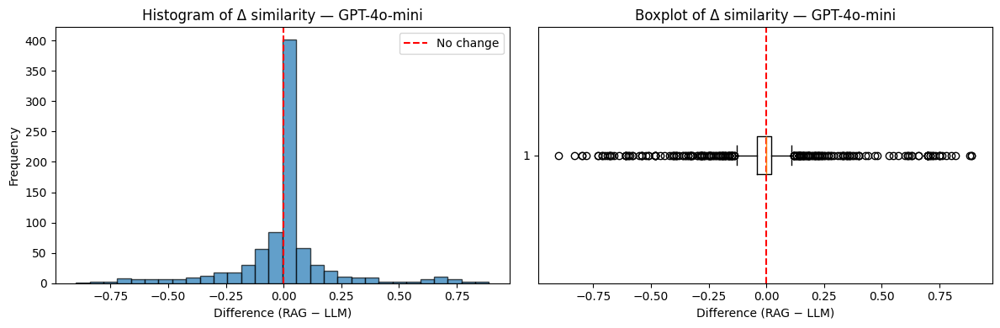

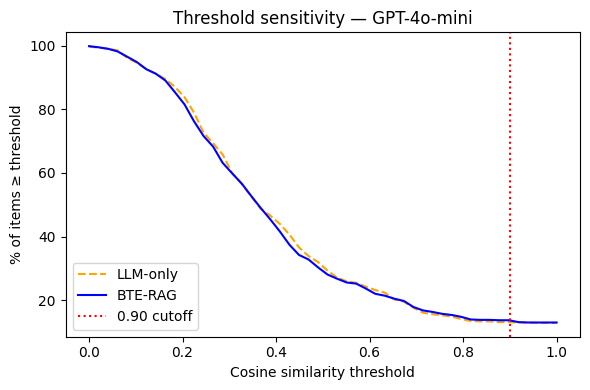


GPT-4o — Drug-Biological Process Similarity Analysis (N=842)

Wilcoxon signed-rank: median Δ=0.000, mean Δ=0.002, stat=41935.5, p=4.06e-01
Mean Δ = 0.002 (95% bootstrap CI: -0.012–0.017)
Median Δ = 0.000 (95% bootstrap CI: 0.000–0.000)
Cliff's delta = -0.002 (95% CI: -0.030–0.025), magnitude: negligible

--- Threshold Sensitivity (with Effect Sizes) ---
Validating 0.90 'high-fidelity' threshold across nearby cutoffs (0.85, 0.90, 0.95)


,Threshold,LLM_%≥thr,RAG_%≥thr,Δ_pp,Cliff_δ,95%_CI,Sig
0,0.85,15.6,17.3,1.8,0.018,"[-0.00, 0.04]",~
1,0.90,15.3,17.1,1.8,0.018,"[-0.00, 0.04]",~
2,0.95,15.3,16.5,1.2,0.012,"[-0.01, 0.03]",~



--- Distribution stats for GPT-4o ---
count    842.000000
mean       0.002257
std        0.220102
min       -0.920000
25%       -0.010000
50%        0.000000
75%        0.000000
max        1.000000
dtype: float64
Proportion improved: 24.0%
Proportion worsened: 25.8%
Proportion unchanged: 50.2%


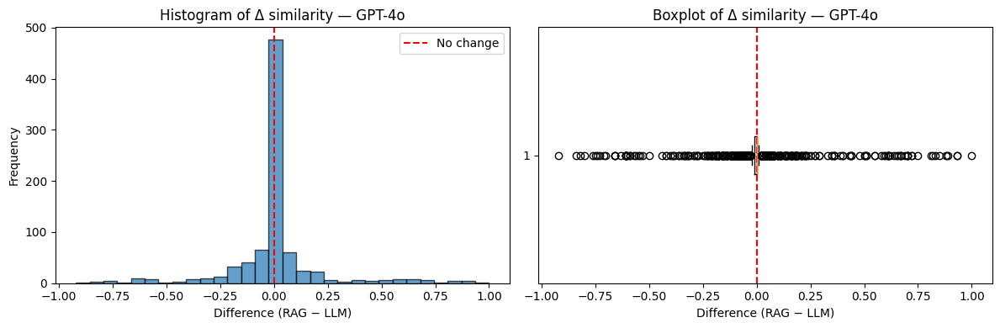

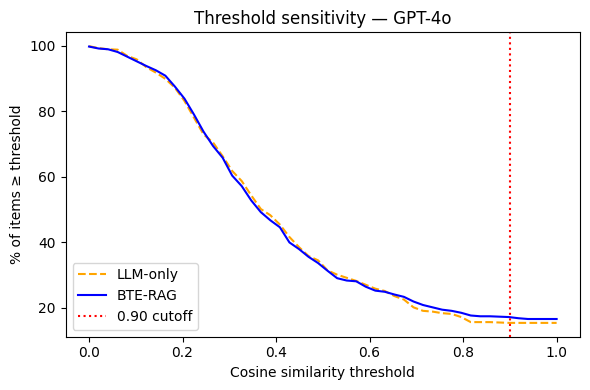

In [31]:
KEY_COLS = ["id", "question", "drug_name", "disease_name", "Drug_MeshID", "disease"]

# ANALYSIS FOR GPT-4o-mini
mini_results = run_bp_similarity_analysis(
    df_llm=go_bp_sampled_questions_4omini,
    df_rag=gpt4omini_2,
    key_cols=KEY_COLS,
    llm_cos_col="cosine_similarity",
    rag_cos_col="cosine_similarity_NC",
    model_label="GPT-4o-mini",
    show_plots=True
)

# ANALYSIS FOR GPT-4o
gpt4o_results = run_bp_similarity_analysis(
    df_llm=go_bp_sampled_questions_4o, 
    df_rag=gpt4o_2,  
    key_cols=KEY_COLS,
    llm_cos_col="cosine_similarity",
    rag_cos_col="cosine_similarity_NC",
    model_label="GPT-4o",
    show_plots=True
)


In [32]:
summary_table = create_summary_table([mini_results, gpt4o_results])
print("\n" + "="*70)
print("SUMMARY TABLE - Drug-Bio.Process Benchmark")
print("="*70)
display(summary_table)


print("\n" + "="*70)
print("THRESHOLD COMPARISON - Enhanced with Effect Sizes")
print("="*70)
print("\nGPT-4o-mini:")
display(mini_results["threshold_table_enhanced"])
print("\nGPT-4o:")
display(gpt4o_results["threshold_table_enhanced"])


SUMMARY TABLE - Drug-Bio.Process Benchmark


,Model,N,Mean Δ (95% CI),Median Δ (95% CI),Cliff's δ (95% CI),Effect Size,Wilcoxon p
0,GPT-4o-mini,842,-0.005 (-0.020–0.011),0.000 (0.000–0.000),-0.018 (-0.048–0.014),negligible,3.13e-01
1,GPT-4o,842,0.002 (-0.012–0.017),0.000 (0.000–0.000),-0.002 (-0.030–0.025),negligible,4.06e-01



THRESHOLD COMPARISON - Enhanced with Effect Sizes

GPT-4o-mini:


,Threshold,LLM_%≥thr,RAG_%≥thr,Δ_pp,Cliff_δ,95%_CI,Sig
0,0.85,13.3,13.8,0.5,0.005,"[-0.02, 0.03]",~
1,0.90,13.1,13.7,0.6,0.006,"[-0.02, 0.03]",~
2,0.95,12.9,12.9,0.0,0.000,"[-0.02, 0.02]",~



GPT-4o:


,Threshold,LLM_%≥thr,RAG_%≥thr,Δ_pp,Cliff_δ,95%_CI,Sig
0,0.85,15.6,17.3,1.8,0.018,"[-0.00, 0.04]",~
1,0.90,15.3,17.1,1.8,0.018,"[-0.00, 0.04]",~
2,0.95,15.3,16.5,1.2,0.012,"[-0.01, 0.03]",~


# Plots

In [86]:
def _hist_panel(df, score_col, ax, y_max=200, label_offset=0.02):
    bins = np.arange(0, 1.05, 0.05)
    data = df[score_col].dropna()

    sns.histplot(
        data, bins=bins, kde=True,
        color='skyblue', edgecolor='black',
        stat='count', ax=ax
    )

    ax.set_ylim(0, y_max)
    ax.set_xlim(0, 1)
    ax.set_xticks(bins)
    ax.set_xticklabels([f'{b:.2f}' for b in bins], rotation=45)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    # bar labels
    for bar in ax.patches:
        h = bar.get_height()
        if h > 0:
            ax.text(
                bar.get_x() + bar.get_width()/2,
                min(h + label_offset*y_max, y_max*1),
                f'{int(h)}',
                ha='center', va='bottom', fontsize=7, rotation=90
            )

    ax.set_xlabel('')   # remove per‑panel labels
    ax.set_ylabel('')

In [87]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import to_rgb

palette = sns.color_palette("colorblind", 2)
BLUE, ORANGE = palette[0], palette[1]

def darker(color, factor=0.5):
    r, g, b = to_rgb(color)
    return (r*factor, g*factor, b*factor)

DARK_BLUE   = darker(BLUE)
DARK_ORANGE = darker(ORANGE)

def make_similarity_figure(
    df, model_readable_name,
    sim_thresholds=range(10, 100, 10),
    include_full=True,
    cols_per_row=5,
    w_per_col=3.2, h_per_row=3.6,
    y_max=200,
    save_dir =None
):
    if save_dir:
        save_dir = Path(save_dir)
    else:
        save_dir = Path('.')      # current working dir
    save_dir.mkdir(parents=True, exist_ok=True)
    # ─ build columns & labels ───────────────────────────────────────────────
    score_cols = [f'cosine_similarity_sim_{t}' for t in sim_thresholds]
    if include_full:
        score_cols = ['cosine_similarity_NC'] + score_cols

    def nice(col):
        if col.endswith('_NC'):
            return 'Full context'
        pct = col.split('_')[-1]
        return f'Context lines > {pct}ᵗʰ percentile'

    col_labels = [nice(c) for c in score_cols]

    # ─ grid geometry ────────────────────────────────────────────────────────
    n_cols = min(cols_per_row, len(score_cols))
    n_rows = int(np.ceil(len(score_cols) / n_cols))
    fig_w, fig_h = w_per_col * n_cols, h_per_row * n_rows

    fig, axes = plt.subplots(
        n_rows, n_cols,
        figsize=(fig_w, fig_h),
        sharex='col', sharey='row',
        constrained_layout=False
    )
    axes = axes.flatten()

    # ─ plot each panel ──────────────────────────────────────────────────────
    for i, (col, label) in enumerate(zip(score_cols, col_labels)):
        ax = axes[i]
        _hist_panel(df, col, ax, y_max=y_max)

        # ▸ recolor bars: orange for “mini” or blue otherwise
        is_mini = 'mini' in model_readable_name.lower()
        base_c, dark_c = (ORANGE, DARK_ORANGE) if is_mini else (BLUE, DARK_BLUE)

        for patch in ax.patches:
            left, width = patch.get_x(), patch.get_width()
            center = left + width/2
            # dark-shade only for bins whose center ≥ 0.9
            patch.set_facecolor(dark_c if center >= 0.9 else base_c)
            patch.set_edgecolor('black')
            patch.set_linewidth(1)

        ax.set_title(label, fontsize=12, pad=6)

    # hide any unused axes
    for ax in axes[len(score_cols):]:
        ax.set_visible(False)

    # ─ layout tweaks ────────────────────────────────────────────────────────
    for ax in axes[:n_cols]:
        ax.tick_params(axis='x', labelbottom=True)

    fig.subplots_adjust(
        left=0.07, right=0.99,
        bottom=0.10, top=0.92,
        wspace=0.25, hspace=0.35
    )

    # ─ global title & labels ───────────────────────────────────────────────
    fig.suptitle(
        f'Distribution of Answer Similarities – {model_readable_name}',
        fontsize=12, fontweight='bold', y=1.0
    )
    fig.supxlabel(
        'Cosine similarity: model answer vs ground-truth answer',
        fontsize=12, y=0.0
    )
    fig.supylabel('No. of Questions', fontsize=12, x=0.02)

    # ─ save outputs ────────────────────────────────────────────────────────
    safe = model_readable_name.lower().replace(' ', '_').replace('-', '-')
    svg_path = save_dir / f'{safe}_similarity_distributions_hist.svg'
    fig.savefig(svg_path, format='svg')

    plt.show()

In [88]:
funct._hist_panel =_hist_panel
funct.make_similarity_figure = make_similarity_figure

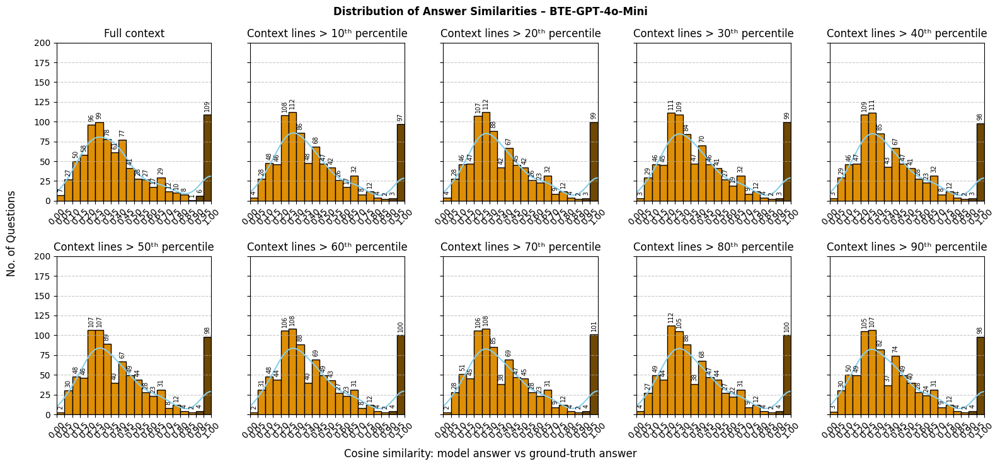

In [89]:
make_similarity_figure(gpt4omini_2, 'BTE‑GPT‑4o‑Mini',save_dir="figures/drug_go_bp/")

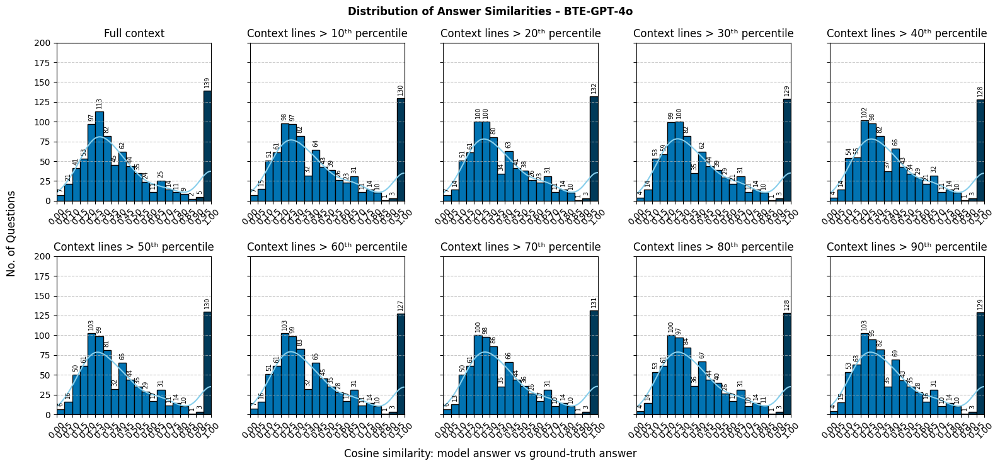

In [90]:
make_similarity_figure(gpt4o_2, 'BTE‑GPT‑4o',save_dir="figures/drug_go_bp/")

In [91]:
palette = sns.color_palette("colorblind", 2)
BLUE, ORANGE = palette  # BLUE for GPT-4o, ORANGE for GPT-4o-mini

def darker(color, factor=0.5):
    """Return a darker shade of the given RGB color."""
    r, g, b = to_rgb(color)
    return (r * factor, g * factor, b * factor)

def plot_score_distribution(
    df,
    score_col='cosine_similarity',
    model_name='model',
    filename=None,
    fill_style='auto',  # 'auto', 'solid', or 'dashed'
    save_dir = None
):
    """
    Histogram with KDE and bar labels for cosine similarity scores.
    - Uses ORANGE for 'mini' models, BLUE otherwise.
    - Bars in the 0.9–1.0 range are darkened.
    - For 'dashed' fill_style (or auto→LLM-only), bars have no fill and dashed outline.
    - All text at fontsize=12.
    - Saves as SVG.
    """
    if save_dir:
        save_dir = Path(save_dir)
    else:
        save_dir = Path('.')      # current working dir
    save_dir.mkdir(parents=True, exist_ok=True)
    
    data = df[score_col].dropna()
    bins = np.arange(0, 1.05, 0.05)

    # Base & dark colors
    base_color = ORANGE if 'mini' in model_name.lower() else BLUE
    dark_color = darker(base_color)

    # Decide hatch pattern
    name_l = model_name.lower()
    if fill_style == 'auto':
        hatch = '///' if 'llm-only' in name_l else None
    elif fill_style == 'dashed':
        hatch = '///'
    else:
        hatch = None

    fig, ax = plt.subplots(figsize=(10, 6))

    # Draw histogram + KDE unchanged
    sns.histplot(
        data, bins=bins, kde=True,
        color=base_color, edgecolor='black',
        stat="count", ax=ax
    )

    # Recolor, hatch/outline and label bars
    for bar in ax.patches:
        left, width = bar.get_x(), bar.get_width()
        center = left + width / 2
        height = bar.get_height()

        if hatch:
            # LLM-only: no fill, dashed outline in base or dark color
            edge = dark_color if center >= 0.9 else base_color
            bar.set_facecolor('none')
            bar.set_edgecolor(edge)
            bar.set_linewidth(1)
            bar.set_hatch(hatch)
        else:
            # BTE-RAG or solid: filled bars as before
            bar.set_facecolor(dark_color if center >= 0.9 else base_color)
            bar.set_edgecolor('black')
            bar.set_linewidth(1)

        if height > 0:
            ax.text(
                center, height + 0.5,
                f'{int(height)}',
                ha='center', va='bottom',
                fontsize=12
            )

    # Titles, labels, ticks & grid
    ax.set_title(f'Distribution of Cosine Similarity Scores: {model_name}', fontsize=20)
    ax.set_xlabel('Cosine Similarity', fontsize=20)
    ax.set_ylabel('Frequency', fontsize=20)
    ax.set_xticks(bins)
    ax.tick_params(axis='x', rotation=45, labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.set_ylim(0, 150)

    plt.tight_layout()

    # Save
    if filename is None:
        safe = model_name.lower().replace(' ', '_').replace('-', '_')
        filename = save_dir / f'{safe}_similarity_distribution.svg'
    fig.savefig(filename, format='svg')
    plt.show()

In [92]:
funct.plot_score_distribution = plot_score_distribution

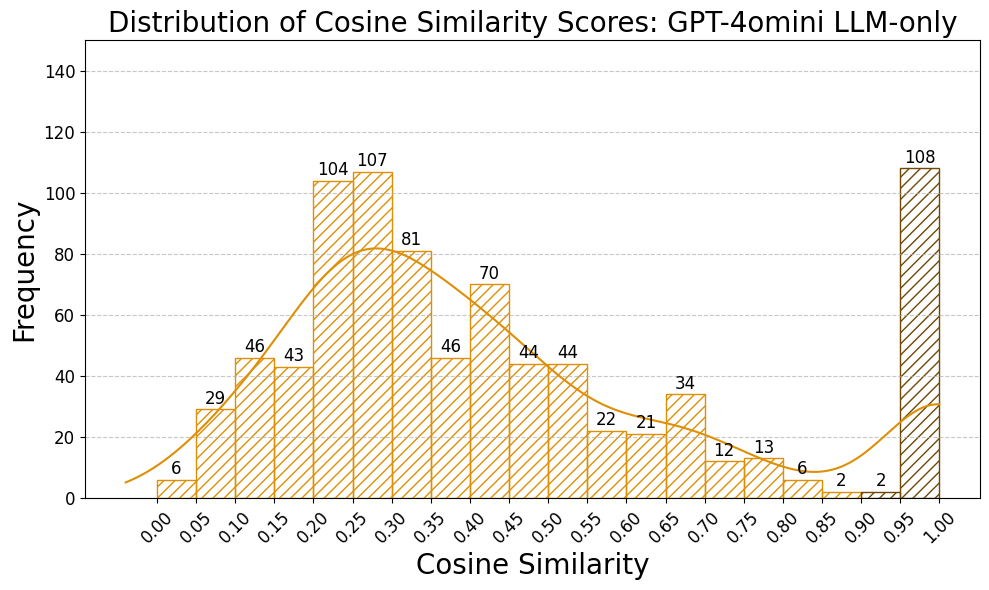

In [93]:
plot_score_distribution(
    go_bp_sampled_questions_4omini,
    score_col='cosine_similarity',
    model_name='GPT-4omini LLM-only',
    save_dir = 'figures/drug_go_bp/'
)

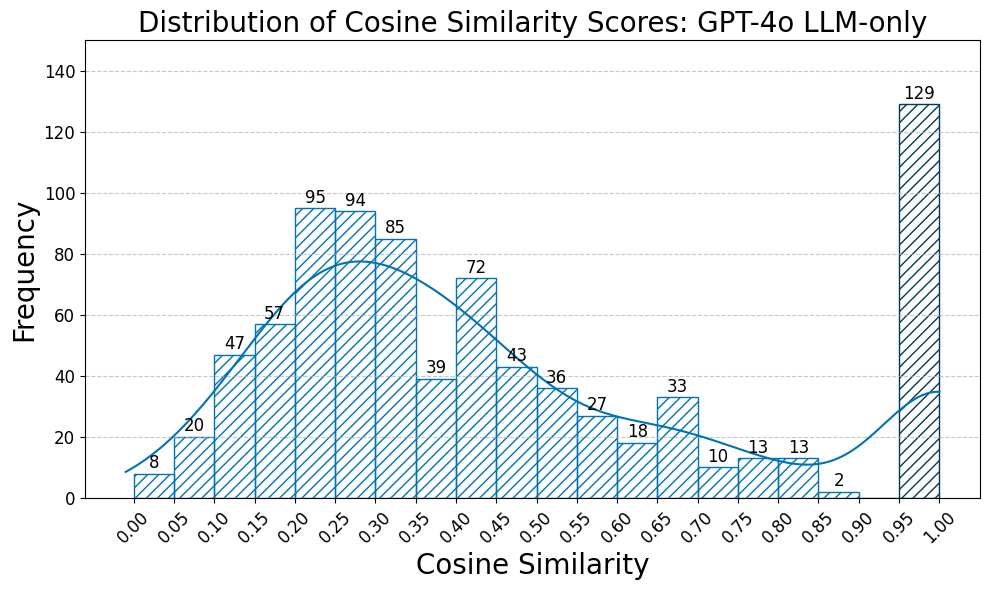

In [94]:
plot_score_distribution(
    go_bp_sampled_questions_4o,
    score_col='cosine_similarity',
    model_name='GPT-4o LLM-only',
    save_dir = 'figures/drug_go_bp/'
)

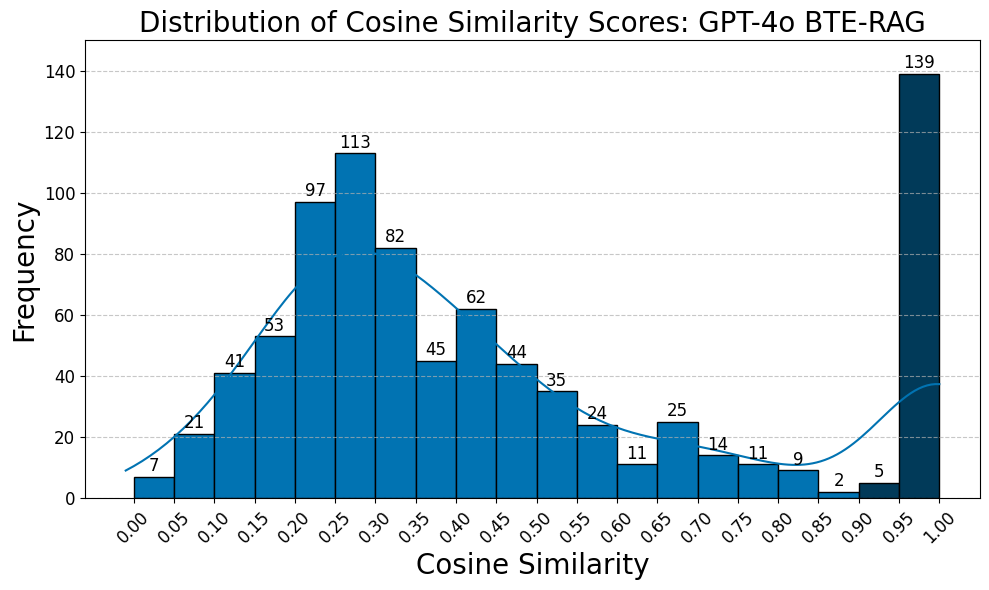

In [95]:
gpt4o_2
plot_score_distribution(
    gpt4o_2,
    score_col='cosine_similarity_NC',
    model_name='GPT-4o BTE-RAG',
    save_dir = 'figures/drug_go_bp/'
)

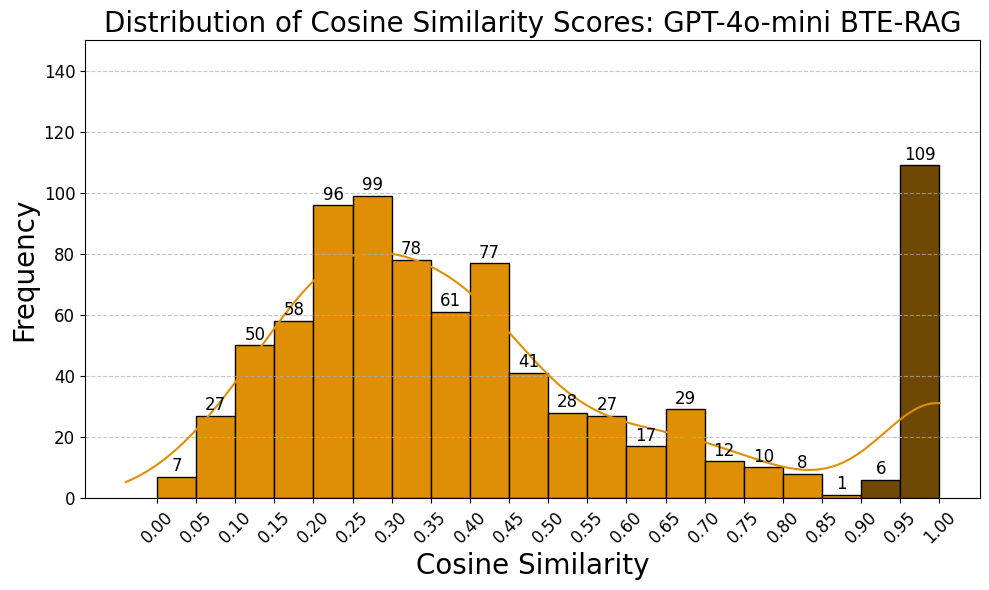

In [96]:
gpt4o_2
plot_score_distribution(
    gpt4omini_2,
    score_col='cosine_similarity_NC',
    model_name='GPT-4o-mini BTE-RAG',
    save_dir = 'figures/drug_go_bp/'
)

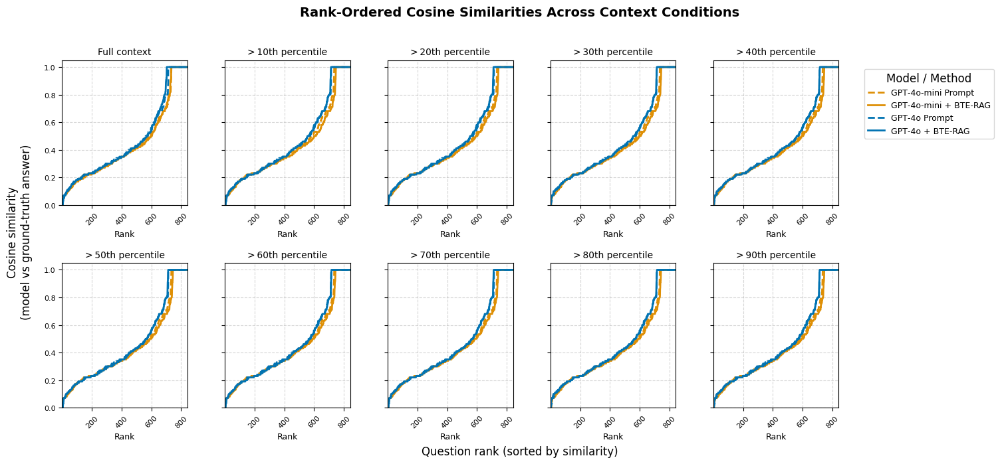

In [99]:
from math import ceil  
dfs = [
    go_bp_sampled_questions_4omini,  # prompt‑only
    gpt4omini_2,                                       # BTE‑RAG
    go_bp_sampled_questions_4o,       # prompt‑only
    gpt4o_2                                            # BTE‑RAG
]
labels    = [
    'GPT‑4o‑mini Prompt',
    'GPT‑4o‑mini + BTE‑RAG',
    'GPT‑4o Prompt',
    'GPT‑4o + BTE‑RAG'
]
is_prompt  = [True, False, True, False]   # True → only has "cosine_similarity"
palette    = sns.color_palette('colorblind', 2)        # orange, blue
colors     = [ palette[1], palette[1], palette[0], palette[0]]
linestyles = ['dashed', 'solid', 'dashed', 'solid']

# ---------------------------------------------------------------------
# 2.  Metric list – Full context + 10 → 90 %
# ---------------------------------------------------------------------
score_cols = ['cosine_similarity_NC'] + [
    f'cosine_similarity_sim_{t}' for t in range(10, 100, 10)
]                                           # 10 columns

# pretty_names = ['Full context'] + [f'≥ {t} % context' for t in range(10, 100, 10)]
pretty_names = ['Full context'] + [f'> {t}th percentile' for t in range(10, 100, 10)]


# ---------------------------------------------------------------------
# 3.  Grid geometry
# ---------------------------------------------------------------------
COLS_PER_ROW = 5
n_cols = COLS_PER_ROW
n_rows = ceil(len(score_cols) / n_cols)

fig_w = 3.2 * n_cols   # inches
fig_h = 3.4 * n_rows
fig, axes = plt.subplots(
    n_rows, n_cols, figsize=(fig_w, fig_h), sharey=True, constrained_layout=False
)
axes = axes.flatten()

# ---------------------------------------------------------------------
# 4.  Plotting loop
# ---------------------------------------------------------------------
for idx, (metric, nice_label) in enumerate(zip(score_cols, pretty_names)):
    ax = axes[idx]

    # track max length across datasets to set x‑limit
    max_len = 1

    for df, lbl, c, ls, prompt_flag in zip(dfs, labels, colors, linestyles, is_prompt):
        col = 'cosine_similarity' if prompt_flag else metric
        if col not in df.columns:
            continue

        data = pd.to_numeric(df[col], errors='coerce').dropna().sort_values()
        if data.empty:
            continue

        ranks = np.arange(1, len(data) + 1)
        max_len = max(max_len, len(data))

        ax.plot(
            ranks, data.values,
            label=lbl,
            color=c, linestyle=ls, linewidth=2
        )

    ax.set_title(nice_label, fontsize=10, pad=6)
    ax.set_xlim(1, max_len)
    ax.set_ylim(0, 1.05)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.set_xlabel('Rank', fontsize=9)
    ax.tick_params(axis='x', rotation=45, labelsize=8)
    ax.tick_params(axis='y', labelsize=8)

# hide any unused axes (if len(score_cols) < n_rows*n_cols)
for ax in axes[len(score_cols):]:
    ax.set_visible(False)

# ---------------------------------------------------------------------
# 5.  Global labels, title, legend, and margin tweaks
# ---------------------------------------------------------------------
fig.subplots_adjust(
    left=0.07, right=0.80,     # leave room for legend on the right
    bottom=0.11, top=0.88,
    wspace=0.30, hspace=0.40
)

fig.suptitle(
    'Rank‑Ordered Cosine Similarities Across Context Conditions',
    fontsize=14, fontweight='bold', y=1
)
fig.supxlabel('Question rank (sorted by similarity)', fontsize=12, y=0.0)
fig.supylabel('Cosine similarity\n(model vs ground‑truth answer)', fontsize=12, x=0.03,  y=0.5,    # centered vertically
    va='center', ha = 'center',
    rotation=90)

# One consolidated legend outside the grid
handles, legends = axes[0].get_legend_handles_labels()
fig.legend(
    handles, legends,
    title='Model / Method',
    fontsize=9, title_fontsize=12,
    loc='upper left',
    bbox_to_anchor=(0.82, 0.87)
)

fig.savefig('figures/drug_go_bp/ranked_similarity_curves_BP.svg')
# fig.savefig('ranked_similarity_curves.png', dpi=300)

plt.show()

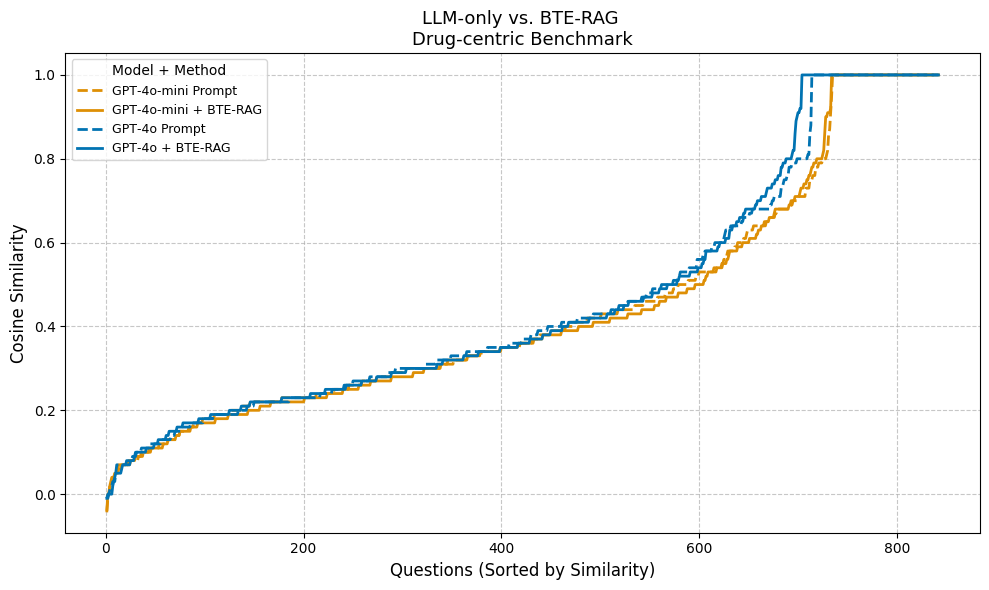

In [100]:
# context lines greater than (Full Context)


# --- Colors & Styles ---
palette = sns.color_palette('colorblind', 2)           # [blue, orange]
colors = [palette[1], palette[1], palette[0], palette[0]]  # mini = orange, 4o = blue
line_styles = ['dashed', 'solid', 'dashed', 'solid']       # Prompt = dashed, RAG = solid

# --- Plot ---
plt.figure(figsize=(10, 6))

for df, label, color, style in zip(dfs, labels, colors, line_styles):
    # Select correct column
    col = 'cosine_similarity' if 'Prompt' in label else 'cosine_similarity_NC'
    if col not in df.columns:
        continue

    data = pd.to_numeric(df[col], errors='coerce').dropna()
    sorted_vals = np.sort(data)
    ranks = np.arange(1, len(sorted_vals) + 1)

    plt.plot(
        ranks, sorted_vals,
        label=label,
        color=color,
        linestyle=style,
        linewidth=2
    )

# --- Labels & Legend ---
plt.title(
    'LLM-only vs. BTE-RAG \nDrug-centric Benchmark',
    fontsize=13
)
plt.xlabel('Questions (Sorted by Similarity)', fontsize=12)
plt.ylabel('Cosine Similarity', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Model + Method', fontsize=9)
plt.tight_layout()
plt.savefig("figures/drug_go_bp/llm_vs_bte_rag_drug_bioprocess.svg", format="svg", bbox_inches="tight")

plt.show()
